In [526]:
import matplotlib.pyplot as plt
import numpy as np

In [586]:
class KMeans:
    """
    Algoritmo de clustering K-Means

    Parametros:
        k (int): Número de clusters a encontrar (por defecto 3)
        max_iter (int): Número maximo de iteraciones (por defecto 100)
        centroids (numpy.ndarray): Cordenadas iniciales del centroides (por defecto ninguna)
    """
    def __init__(self, k=3, max_iter=100, centroids = None):
        """
        Constructor de objetos kMeans

        Parametros:
            k (int): Número de cluster
            max_iter (int): Número maximo de iteraciones
        """
        self.k = k
        self.max_iter = max_iter
        self.centroids = centroids

    def distancia_euclideana(self, p1, p2):
        """
        Calcula la distancia Euclideana entre dos puntos.

        Parametros:
            point1 (numpy.ndarray): Primer punto
            point2 (numpy.ndarray): Segundo punto

        Returns:
            float: La distancia euclideana entre los dos puntos
        """
        return np.sqrt(np.sum((p1 - p2)**2))

    def distancia_manhattan(self, point1, point2):
        """
        Calcula la distancia de Manhattan entre dos puntos

        Parametros:
            point1 (numpy.ndarray): Primer punto.
            point2 (numpy.ndarray): Segundo punto

        Returns:
            float: Distancia de Manhattan entre dos puntos
        """
        return np.sum(np.abs(point1 - point2))

    def distancia_mahalanobis(self, point1, point2, covariance_matrix):
        """
        Cacula la distancia de Mahalanobis entre dos puntos

        Parametros:
            point1 (numpy.ndarray): Primer punto.
            point2 (numpy.ndarray): Segundo punto.
            covariance_matrix (numpy.ndarray): Matrix de covarancia de los datos.

        Returns:
            float: La distancia de Mahalanobis entre dos puntos
        """
        diff = point1 - point2
        return np.sqrt(diff @ np.linalg.inv(covariance_matrix) @ diff.T)

    def calcular_centroides(self, points, labels):
        """
        Calcula los centroides de la nube de puntos dada por la asignación en la variable labels

        Parametros:
            points (numpy.ndarray): Nube de puntos
            labels (numpy.ndarray): Cluster asignado para cada punto

        Returns:
            numpy.ndarray: Centroides de cada cluster
        """

        centroids = np.zeros((self.k, points.shape[1]))
        for i in range(self.k):
            cluster_points = points[labels == i]
            if len(cluster_points) > 0:
              centroids[i] = np.mean(cluster_points, axis=0)
        return centroids

    def run(self, points, tipo_distance='euclidean'):
        """
        Ejecuta un algoritmo K-Means dado la nube de puntos recibida como parametro

        Parametros:
            points (numpy.ndarray): Nube de puntos
            tipo_distance (str): Tipo de distancia a utilizar ('euclidean', 'manhattan', or 'mahalanobis'). Por defecto  'euclidean'.

        Returns:
            numpy.ndarray: El cluster asignado a cada grupo
        """

        indices = np.random.choice(points.shape[0], self.k, replace=False)
        self.centroids = points[indices]

        for _ in range(self.max_iter):
            labels = np.zeros(points.shape[0], dtype=int)
            for i, point in enumerate(points):
                if tipo_distance == 'euclidean':
                    distances = [self.distancia_euclideana(point, centroid) for centroid in self.centroids]
                elif tipo_distance == 'manhattan':
                    distances = [self.distancia_manhattan(point, centroid) for centroid in self.centroids]
                elif tipo_distance == 'mahalanobis':
                    covariance_matrix = np.cov(points, rowvar=False)
                    distances = [self.distancia_mahalanobis(point, centroid, covariance_matrix) for centroid in self.centroids]
                else:
                    raise ValueError("Tipo de distancia no disponible")
                labels[i] = np.argmin(distances)

            new_centroids = self.calcular_centroides(points, labels)

            if np.array_equal(self.centroids, new_centroids):
                break

            self.centroids = new_centroids
        return labels

In [528]:
def dibujar2D (points, centroids, labels):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.scatter(points[:, 0], points[:, 1], c='blue', label='Puntos')
    plt.title('Antes de kmeans')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.scatter(points[:, 0], points[:, 1], c=labels, cmap='viridis', label='Puntos')
    plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='*', s=200, label='Centroides finales')
    plt.title('Despues de kmeans')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend()

    plt.tight_layout()
    plt.show()

def dibujar3D (points, centroids, labels):
    fig = plt.figure(figsize=(10, 5))
    ax1 = fig.add_subplot(121, projection='3d')
    ax1.scatter(points[:, 0], points[:, 1], points[:, 2], c='blue', label='Puntos')
    ax1.set_title('Antes de kmeans')
    ax1.set_xlabel('X')
    ax1.set_ylabel('Y')
    ax1.set_zlabel('Z')
    ax1.legend()


    # Plot the points and final centroids
    ax2 = fig.add_subplot(122, projection='3d')
    ax2.scatter(points[:, 0], points[:, 1], points[:, 2], c=labels, cmap='viridis', label='Puntos')
    ax2.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], c='red', marker='*', s=200, label='Centroides finales')
    ax2.set_title('Despues de kmeans')
    ax2.set_xlabel('X')
    ax2.set_ylabel('Y')
    ax2.set_zlabel('Z')
    ax2.legend()

    plt.tight_layout()
    plt.show()

In [529]:
# Ejemplo de uso (datos con 2 caracteristicas) usando distancia euclideana
points = np.array([[1, 2], [1.5, 1.8], [5, 8], [8, 8], [1, 0.6], [9, 11]])
kmeans = KMeans(k=2)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[1 1 0 0 1 0]
[[7.33333333 9.        ]
 [1.16666667 1.46666667]]


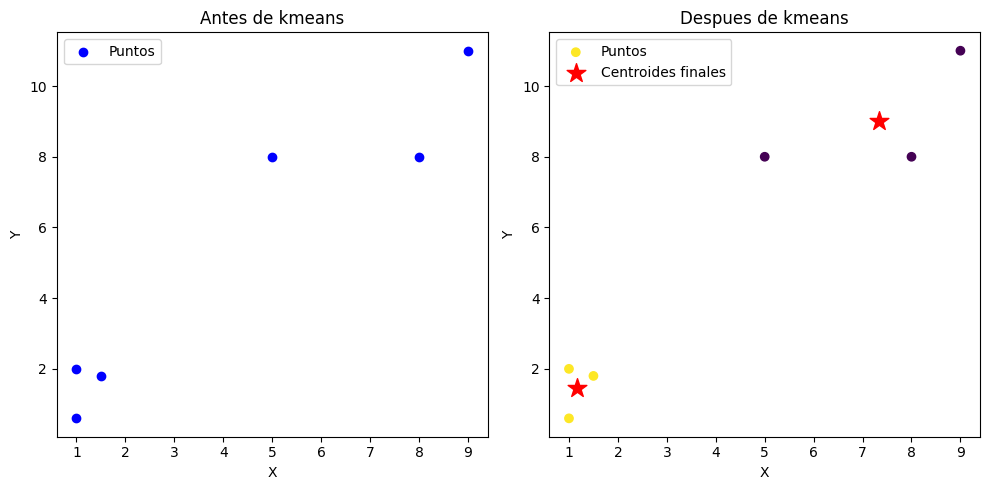

In [530]:
dibujar2D(points, kmeans.centroids, labels)

In [531]:
# Ejemplo de uso (datos con 2 caracteristicas) usando distancia de Manhattan
points = np.array([[1, 2], [1.5, 1.8], [5, 8], [8, 8], [1, 0.6], [9, 11]])
kmeans = KMeans(k=2)
labels = kmeans.run(points, tipo_distance="mahalanobis")
print(labels)
print(kmeans.centroids)

[1 0 1 0 0 0]
[[4.875 5.35 ]
 [3.    5.   ]]


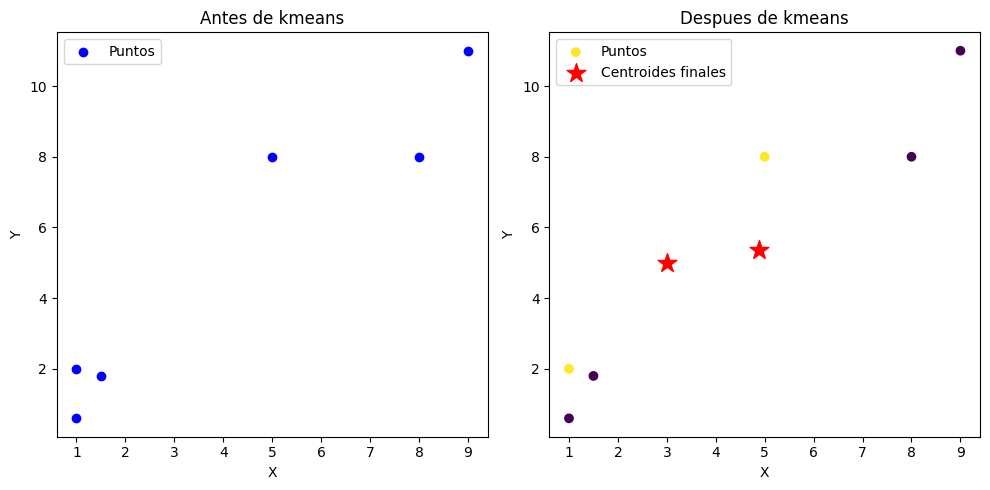

In [532]:
dibujar2D(points, kmeans.centroids, labels)

In [533]:
# Ejemplo de uso (datos con 3 caracteristicas)
points = np.array([[1, 2, 0], [1.5, 1.8, 6], [-1, 5, 8], [3.2, 8, 8], [3, 1, 0.6], [-8, 9, 11]])
kmeans = KMeans(k=3)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[0 0 1 2 0 1]
[[ 1.83333333  1.6         2.2       ]
 [-4.5         7.          9.5       ]
 [ 3.2         8.          8.        ]]


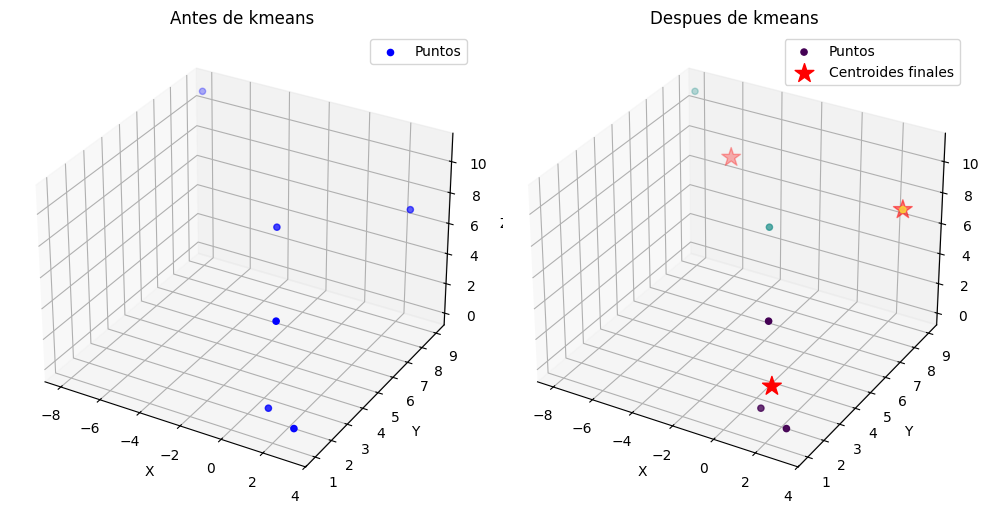

In [534]:
dibujar3D(points, kmeans.centroids, labels)

In [535]:
from sklearn.datasets import make_blobs
points, y = make_blobs(n_samples = 500,n_features = 2,centers = 4,random_state = 23)

In [536]:
kmeans = KMeans(k=3)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[1 2 2 1 2 1 0 2 0 0 0 0 2 2 2 2 1 0 0 2 0 2 0 2 2 2 0 2 0 1 0 0 0 0 1 2 2
 2 0 2 0 0 2 2 0 2 2 0 2 2 2 1 1 2 1 2 2 2 2 1 0 2 2 0 1 2 2 2 2 2 0 2 2 2
 0 1 1 2 2 0 2 0 2 0 2 1 2 2 1 0 2 1 0 0 2 0 1 2 2 2 2 0 2 2 2 1 1 2 1 2 2
 0 2 2 2 0 0 1 0 2 1 2 2 1 2 2 0 2 2 1 1 0 2 2 2 1 1 1 1 2 0 2 1 1 2 0 2 2
 2 2 2 0 2 2 0 1 0 2 2 1 1 2 2 2 1 2 1 1 2 2 2 2 2 1 1 0 2 2 2 0 2 1 2 1 1
 2 0 1 1 0 0 1 0 2 0 1 2 2 1 2 0 2 2 2 0 2 2 1 2 2 0 2 2 2 1 0 2 2 0 2 1 2
 1 2 0 1 2 1 0 1 2 2 2 2 2 0 2 1 2 2 2 2 0 2 2 0 0 1 2 2 2 2 1 2 1 2 1 2 0
 0 0 2 2 1 2 1 2 1 0 0 2 2 0 1 0 1 1 2 1 0 2 1 2 0 0 1 1 2 2 1 2 2 0 0 2 0
 2 1 0 2 1 2 2 0 1 2 0 2 1 2 0 1 2 2 2 1 1 2 1 0 2 2 2 2 2 0 1 2 1 2 2 2 2
 0 1 0 0 2 0 2 2 2 0 2 2 1 1 1 2 2 2 1 1 0 2 2 2 2 1 1 2 1 2 1 1 1 2 2 1 1
 0 2 1 2 0 0 2 1 1 2 0 0 2 1 2 0 0 2 2 2 2 0 0 0 2 2 0 1 2 1 2 2 2 1 0 2 1
 2 2 2 0 0 2 2 1 0 0 0 2 2 0 1 0 1 2 0 1 2 2 1 2 0 2 1 0 0 2 2 0 1 1 2 1 2
 0 0 2 1 1 0 2 0 0 2 0 2 1 1 1 2 1 2 2 2 0 0 1 2 2 2 0 0 1 0 1 0 2 2 0 2 2
 2 2 1 1 0 2 1 2 2 2 0 1 

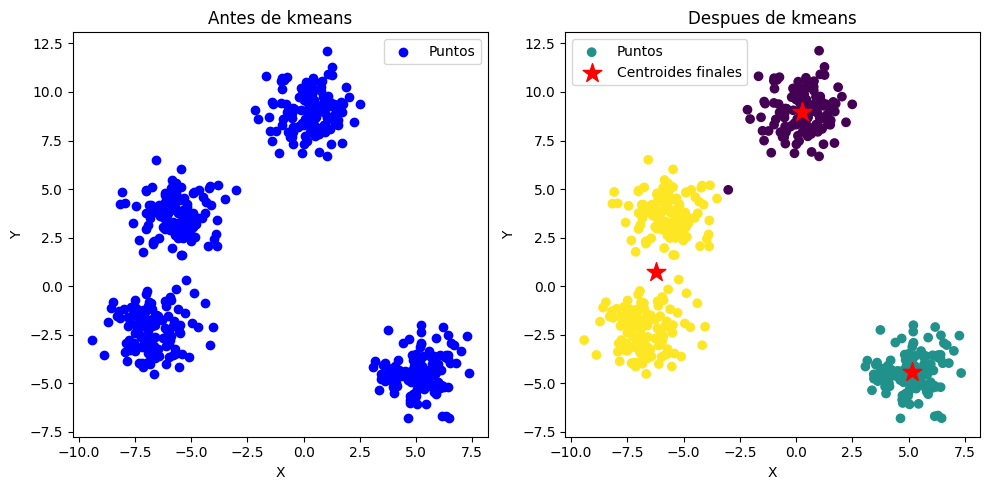

In [537]:
dibujar2D(points, kmeans.centroids, labels)

#GrupoUno#

#-Luis Correa#
#-Maily Silva#
#-Valeria Marquez#

# **PUNTO 1**

In [538]:
from sklearn.datasets import make_blobs
points, y = make_blobs(n_samples = 1000,n_features = 2,centers = 4,random_state = 23)

In [539]:
kmeans = KMeans(k=3, max_iter=10)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[1 2 0 2 2 2 2 2 2 0 0 0 2 1 1 2 2 2 1 1 0 2 2 2 0 0 2 1 0 0 0 2 1 1 2 2 2
 2 2 2 0 1 1 2 2 2 0 1 2 2 2 2 2 2 0 2 0 0 2 1 0 0 2 2 2 2 1 1 1 2 2 0 0 1
 2 2 0 1 2 2 0 2 2 2 0 0 1 2 2 2 0 1 2 0 2 0 1 1 2 1 2 2 2 2 1 2 2 1 2 2 0
 1 2 1 2 2 2 2 2 1 0 2 1 2 1 2 0 2 0 1 2 2 0 2 2 1 1 2 2 2 1 0 0 2 2 1 1 2
 1 1 0 1 0 0 2 1 2 1 2 0 2 2 0 2 2 2 1 0 2 1 2 1 2 1 0 2 0 0 2 2 1 1 1 2 2
 2 0 2 2 1 1 2 1 2 1 2 2 0 2 1 1 0 2 2 0 0 2 0 2 0 0 2 0 2 2 0 2 2 0 1 2 2
 0 2 0 2 0 2 2 2 0 2 2 2 2 1 2 1 2 2 0 1 0 2 2 2 2 2 2 1 0 2 1 0 2 2 0 2 0
 2 1 2 2 0 1 1 2 0 0 2 2 2 0 2 1 2 0 1 1 2 2 1 1 0 1 2 1 2 0 0 1 0 0 1 2 2
 1 2 0 1 2 2 2 2 1 2 0 2 1 0 0 1 0 0 2 2 1 0 2 2 0 2 0 1 1 0 2 2 1 2 1 1 0
 2 0 1 0 0 2 0 0 2 0 2 2 2 0 0 1 2 2 1 0 2 2 1 1 0 1 2 2 1 0 2 1 2 2 1 1 0
 1 2 2 2 2 2 1 2 2 1 1 0 2 2 2 2 2 0 0 2 0 1 2 2 2 2 0 0 2 1 1 1 2 0 0 1 2
 1 0 1 2 2 0 2 2 2 0 1 2 2 2 2 1 2 2 1 2 1 2 2 2 2 0 0 2 2 1 1 2 1 2 2 1 1
 0 1 2 2 0 0 0 2 2 2 0 1 1 1 2 1 2 2 0 2 2 2 1 2 2 2 2 2 2 2 0 2 1 0 0 1 0
 0 2 0 2 0 1 1 2 2 2 1 2 

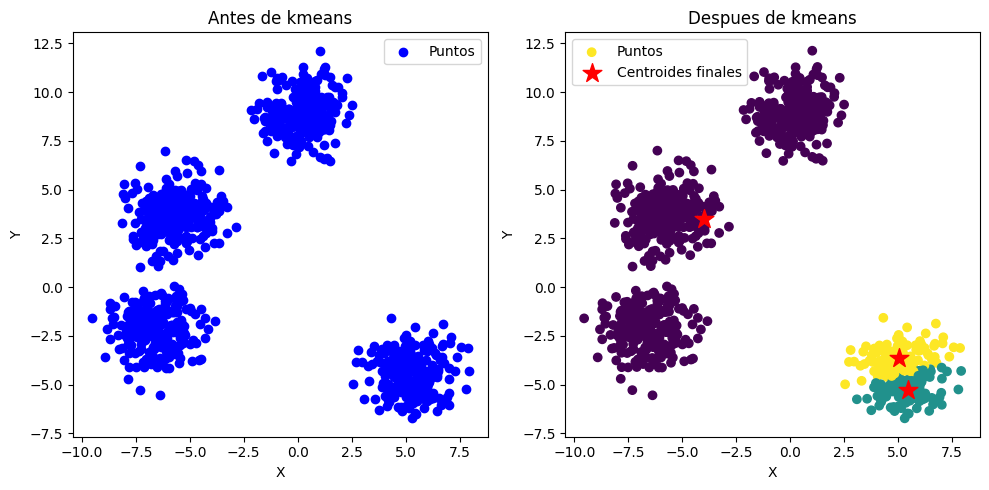

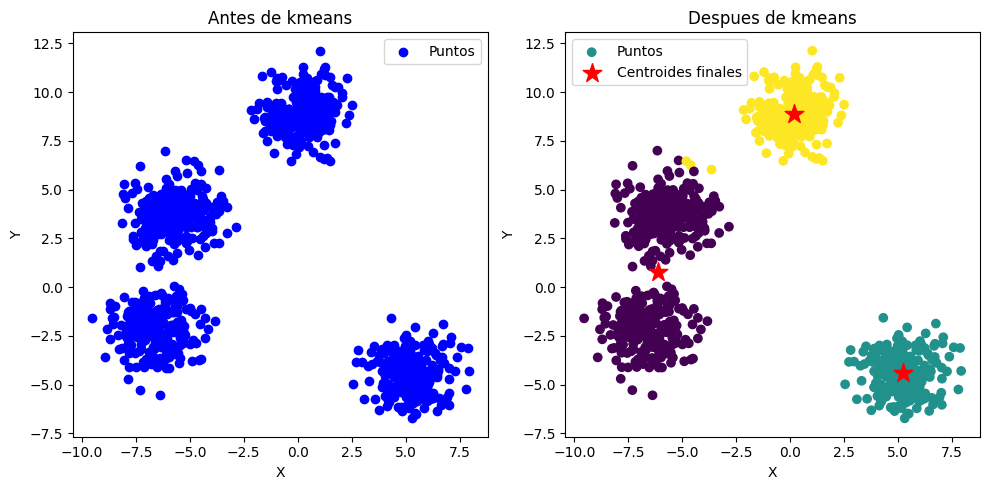

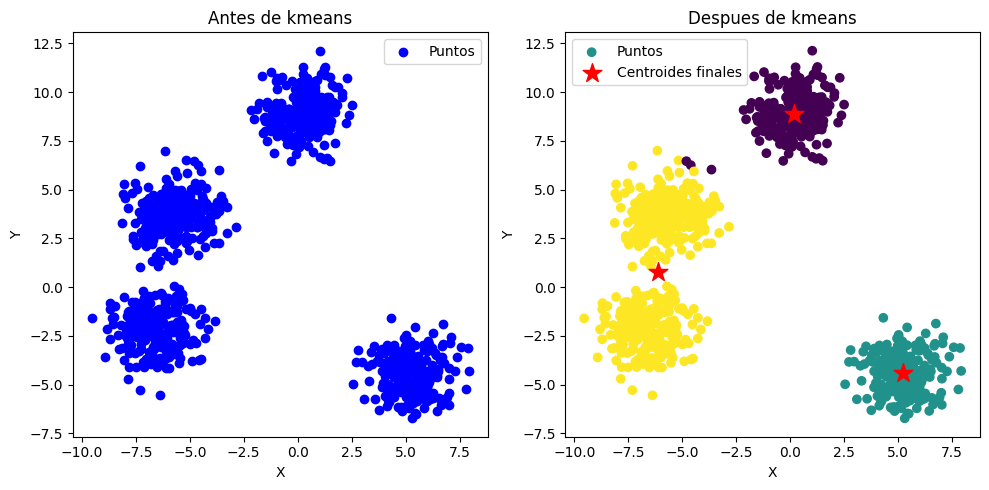

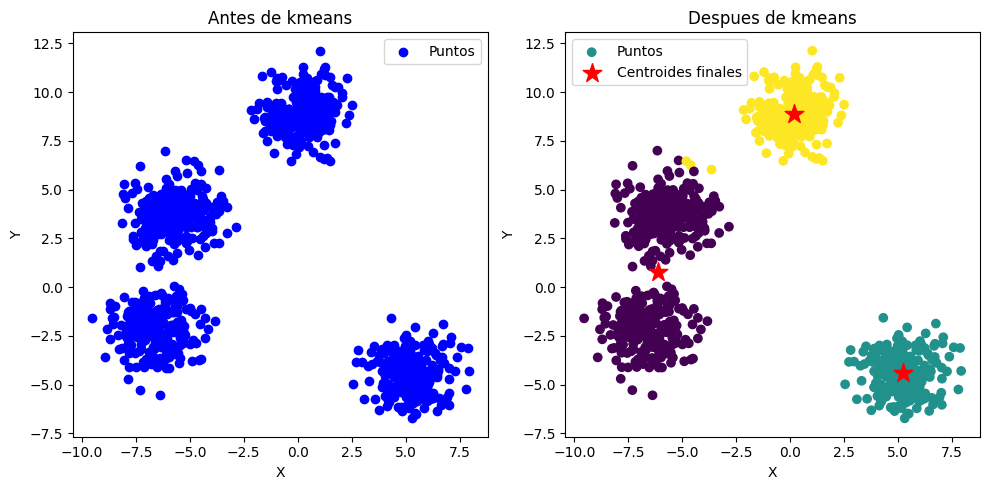

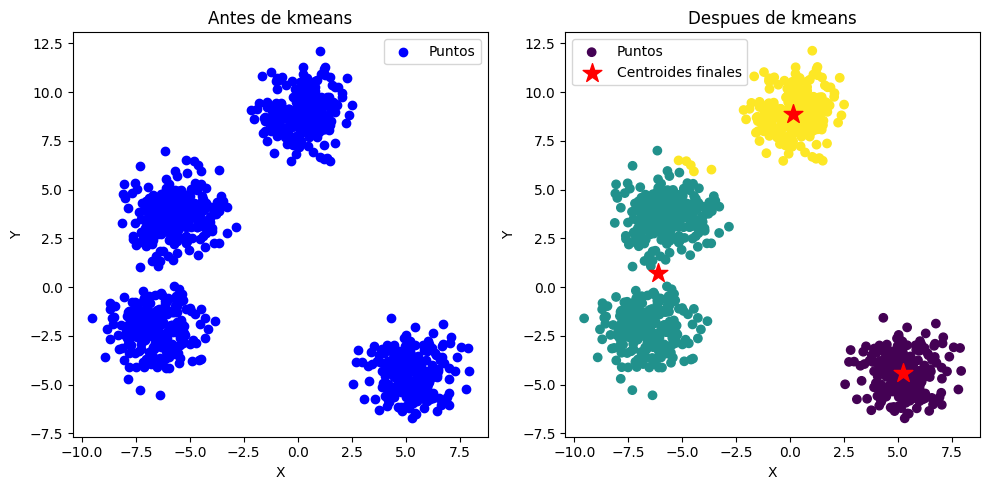

In [540]:
for i in range(5):
  kmeans = KMeans(k=3, max_iter=10)
  labels = kmeans.run(points)
  dibujar2D(points, kmeans.centroids, labels)

# Conclusión Experimento 1 (10 iteraciones)

al ejecutar el codigo, nos muestra una grafica que contiene el antes y el despues del kmeans, podemos observar que en el antes del kmean se muestran los puntos sin ninguna agrupacion y de color azul. por otro lado podemos observar que despues de kmeans la ubicacion de los centroides, y el cambio que realiza en la iteración numero 2 y ademas estan divididos por agrupaciones o cluster el cual tienen un color diferente. tambien podemos visualizar que la agrupación o cluster superior toma parte de los puntos de la agrupacion o cluster que esta en la izquierda.




In [541]:
kmeans = KMeans(k=3, max_iter=100)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[0 1 2 1 1 1 1 1 1 2 2 2 1 0 0 1 1 1 0 0 2 1 1 1 2 2 1 0 2 2 2 1 0 0 1 1 1
 1 1 1 2 0 0 1 1 1 2 0 1 1 1 1 1 1 2 1 2 2 1 0 2 2 1 1 1 1 0 0 0 1 1 2 2 0
 1 1 2 0 1 1 2 1 1 1 2 2 0 1 1 1 2 0 1 2 1 2 0 0 1 0 1 1 1 1 0 1 1 0 1 1 2
 0 1 0 1 1 1 1 1 0 2 1 0 1 0 1 2 1 2 0 1 1 2 1 1 0 0 1 1 1 0 2 2 1 1 0 0 1
 0 0 2 0 2 2 1 0 1 0 1 2 1 1 2 1 1 1 0 2 1 0 1 0 1 0 2 1 2 2 1 1 0 0 0 1 1
 1 2 1 1 0 0 1 0 1 0 1 1 2 1 0 0 2 1 1 2 2 1 2 1 2 2 1 2 1 1 2 1 1 2 0 1 1
 2 1 2 1 2 1 1 1 2 1 1 1 1 0 1 0 1 1 2 0 2 1 1 1 1 1 1 0 2 1 0 2 1 1 2 1 2
 1 0 1 1 2 0 0 1 2 2 1 1 1 2 1 0 1 2 0 0 1 1 0 0 2 0 1 0 1 2 2 0 2 2 0 1 1
 0 1 2 0 1 1 1 1 0 1 2 1 0 2 2 0 2 2 1 1 0 2 1 1 2 1 2 0 0 2 1 1 0 1 0 0 2
 1 2 0 2 2 1 2 2 1 2 1 1 1 2 2 0 1 1 0 2 1 1 0 0 2 0 1 1 0 2 1 0 1 1 0 0 2
 0 1 1 1 1 1 0 1 1 0 0 2 1 1 1 1 1 2 2 1 2 0 1 1 1 1 2 2 1 0 0 0 1 2 2 0 1
 0 2 0 1 1 2 1 1 1 2 0 1 1 1 1 0 1 1 0 1 0 1 1 1 1 2 2 1 1 0 0 1 0 1 1 0 0
 2 0 1 1 2 2 2 1 1 1 2 0 0 0 1 0 1 1 2 1 1 1 0 1 1 1 1 1 1 1 2 1 0 2 2 0 2
 2 1 2 1 2 0 0 1 1 1 0 1 

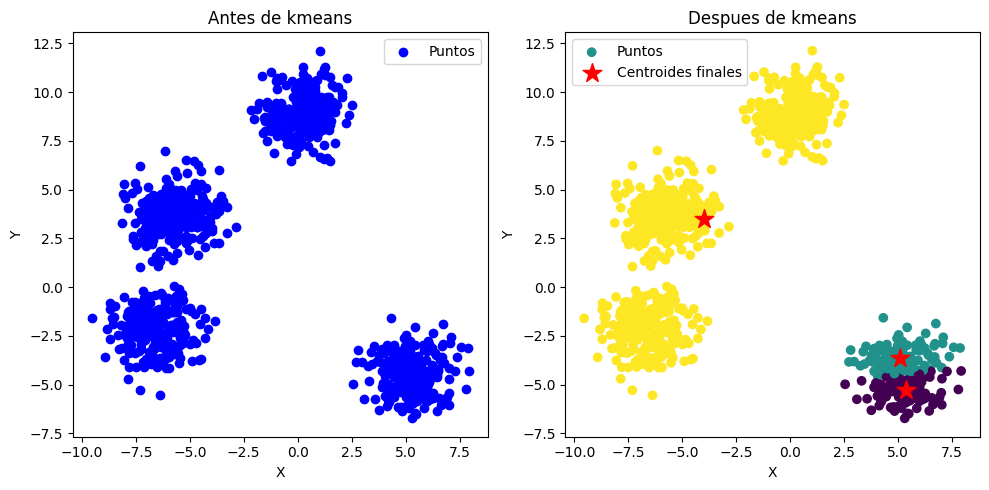

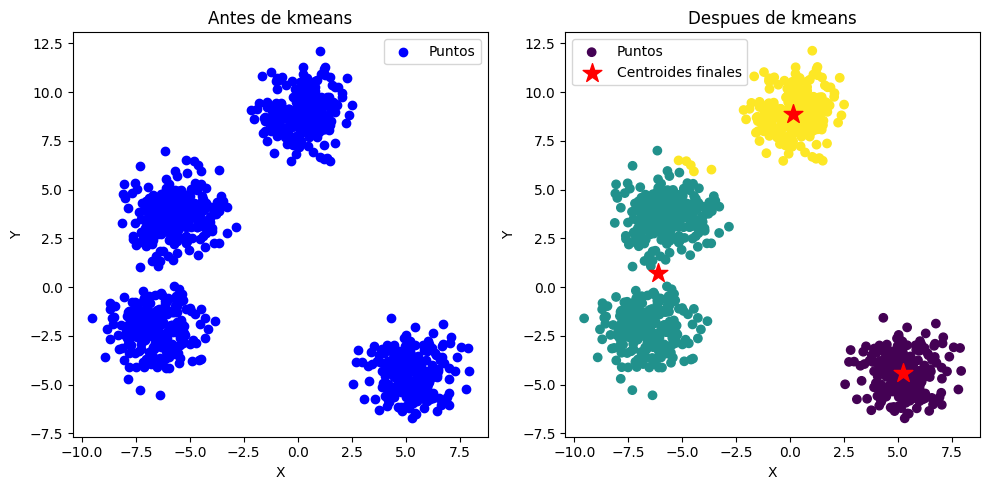

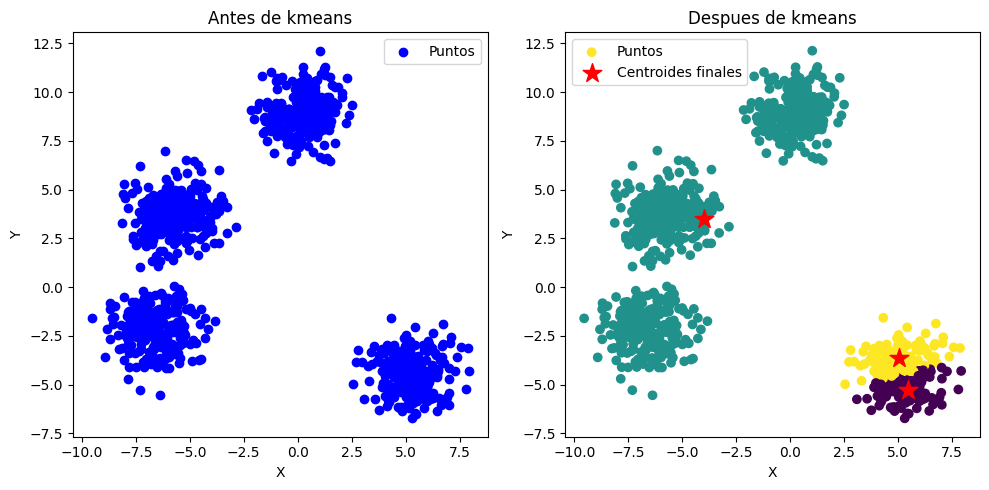

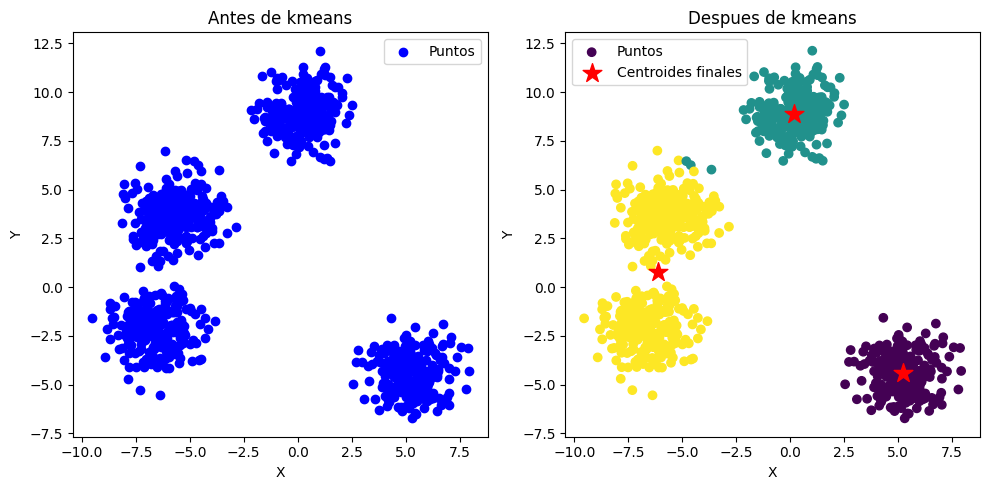

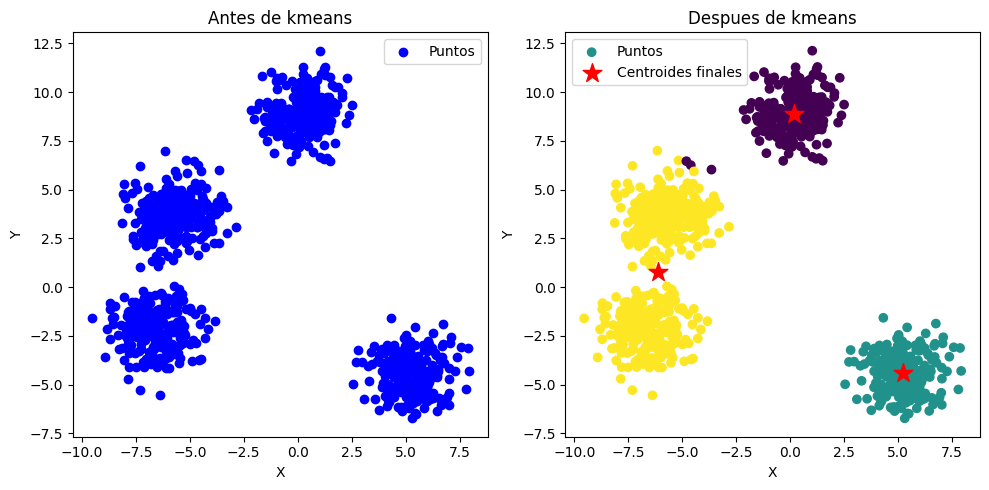

In [542]:
for i in range(5):
  kmeans = KMeans(k=3, max_iter=100)
  labels = kmeans.run(points)
  dibujar2D(points, kmeans.centroids, labels)

# **Conclusion experimento 2 (100 iteraciones)**

podemos observar al igual que el punto anterior las diferentes graficas que nos muestran el antes y despues del kmeans de tal manera que en el despues de kmeans los centroides no cambian su ubicación y tambien pudimos observar que asi como en el punto 1, el cluster (agrupación) superior toma puntos del cluster del centro

In [543]:
kmeans = KMeans(k=3, max_iter=1000)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[0 1 2 1 1 1 1 1 1 2 2 2 1 0 0 1 1 1 0 0 2 1 1 1 2 2 1 0 2 2 2 1 0 0 1 1 1
 1 1 1 2 0 0 1 1 1 2 0 1 1 1 1 1 1 2 1 2 2 1 0 2 2 1 1 1 1 0 0 0 1 1 2 2 0
 1 1 2 0 1 1 2 1 1 1 2 2 0 1 1 1 2 0 1 2 1 2 0 0 1 0 1 1 1 1 0 1 1 0 1 1 2
 0 1 0 1 1 1 1 1 0 2 1 0 1 0 1 2 1 2 0 1 1 2 1 1 0 0 1 1 1 0 2 2 1 1 0 0 1
 0 0 2 0 2 2 1 0 1 0 1 2 1 1 2 1 1 1 0 2 1 0 1 0 1 0 2 1 2 2 1 1 0 0 0 1 1
 1 2 1 1 0 0 1 0 1 0 1 1 2 1 0 0 2 1 1 2 2 1 2 1 2 2 1 2 1 1 2 1 1 2 0 1 1
 2 1 2 1 2 1 1 1 2 1 1 1 1 0 1 0 1 1 2 0 2 1 1 1 1 1 1 0 2 1 0 2 1 1 2 1 2
 1 0 1 1 2 0 0 1 2 2 1 1 1 2 1 0 1 2 0 0 1 1 0 0 2 0 1 0 1 2 2 0 2 2 0 1 1
 0 1 2 0 1 1 1 1 0 1 2 1 0 2 2 0 2 2 1 1 0 2 1 1 2 1 2 0 0 2 1 1 0 1 0 0 2
 1 2 0 2 2 1 2 2 1 2 1 1 1 2 2 0 1 1 0 2 1 1 0 0 2 0 1 1 0 2 1 0 1 1 0 0 2
 0 1 1 1 1 1 0 1 1 0 0 2 1 1 1 1 1 2 2 1 2 0 1 1 1 1 2 2 1 0 0 0 1 2 2 0 1
 0 2 0 1 1 2 1 1 1 2 0 1 1 1 1 0 1 1 0 1 0 1 1 1 1 2 2 1 1 0 0 1 0 1 1 0 0
 2 0 1 1 2 2 2 1 1 1 2 0 0 0 1 0 1 1 2 1 1 1 0 1 1 1 1 1 1 1 2 1 0 2 2 0 2
 2 1 2 1 2 0 0 1 1 1 0 1 

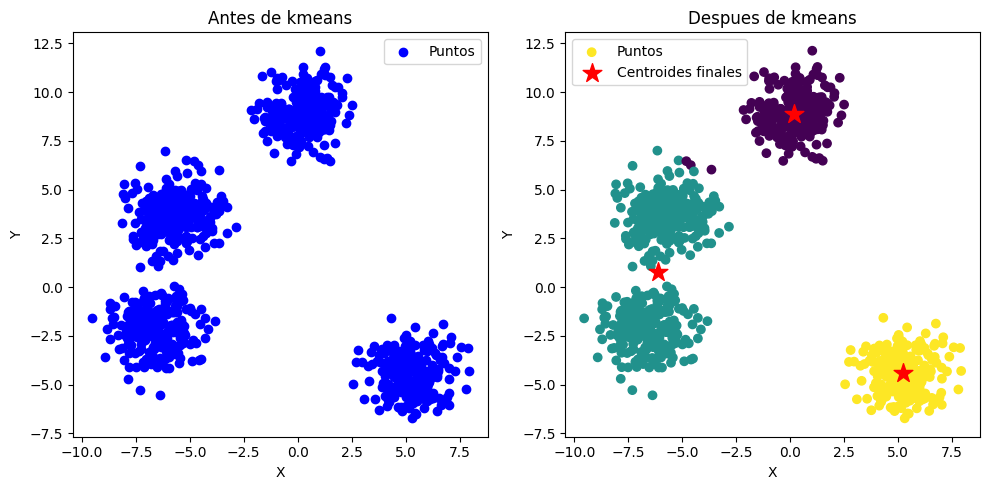

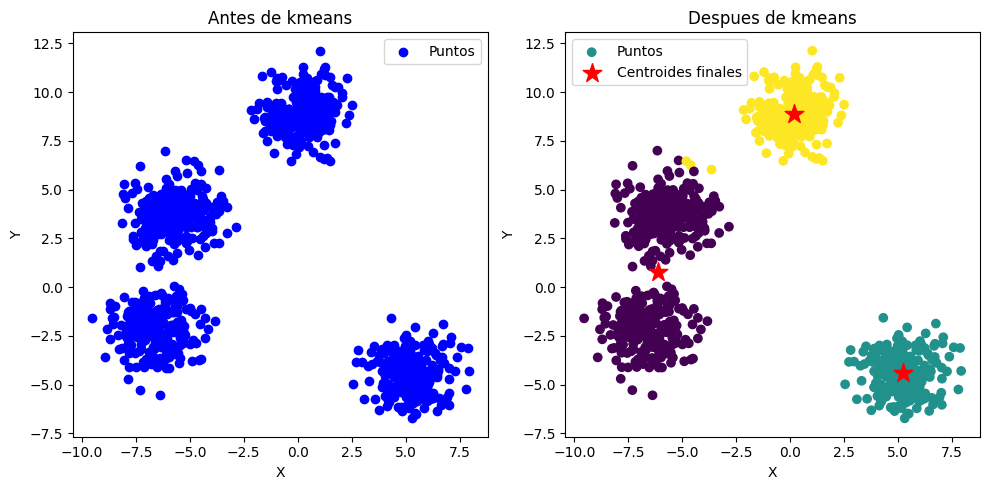

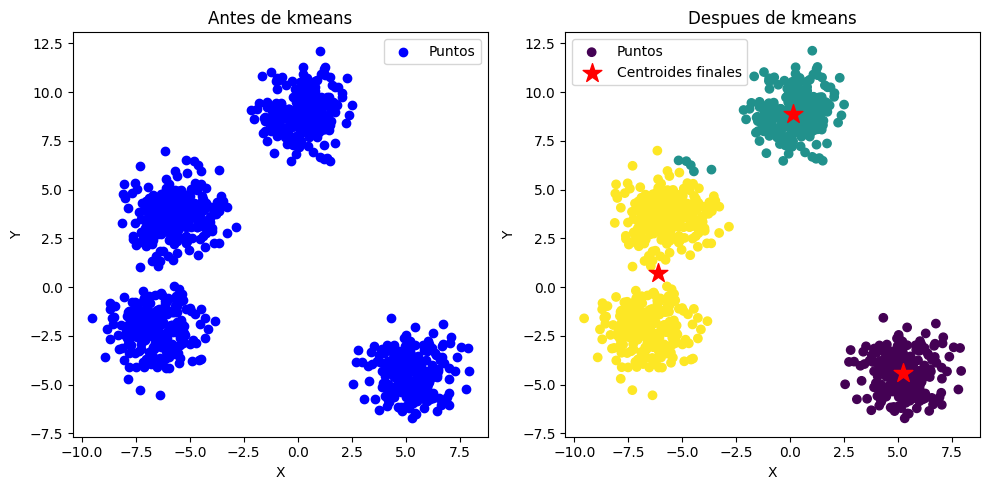

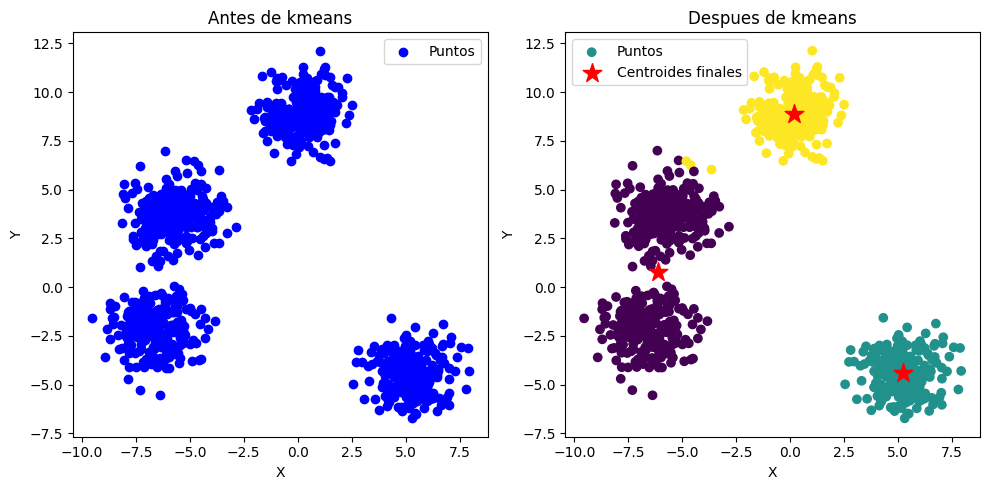

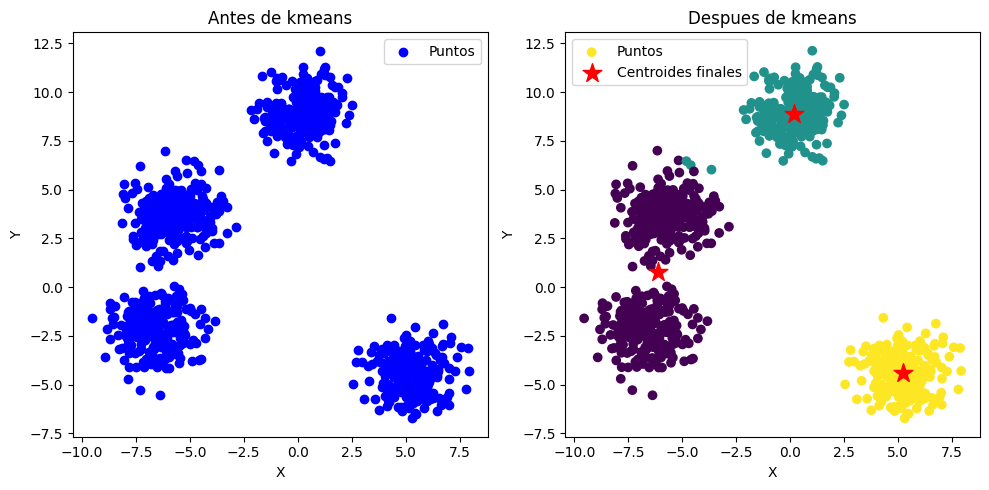

In [544]:
for i in range(5):
  kmeans = KMeans(k=3, max_iter=1000)
  labels = kmeans.run(points)
  dibujar2D(points, kmeans.centroids, labels)

# Conclusión experimento 3 (1000 iteraciones)

 en las diferentes iteraciones podemos observar que estan agrupados y con colores diferentes entre cada cluster, los centroides estan ubicados en la misma ubicacion en cada iteracion y tambien notamos que el cluster superior toma puntos del cluster central.



In [545]:
kmeans = KMeans(k=3, max_iter=10000)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[0 2 1 2 2 2 2 2 2 1 1 1 2 0 0 2 2 2 0 0 1 2 2 2 1 1 2 0 1 1 1 2 0 0 2 2 2
 2 2 2 1 0 0 2 2 2 1 0 2 2 2 2 2 2 1 2 1 1 2 0 1 1 2 2 2 2 0 0 0 2 2 1 1 0
 2 2 1 0 2 2 1 2 2 2 1 1 0 2 2 2 1 0 2 1 2 1 0 0 2 0 2 2 2 2 0 2 2 0 2 2 1
 0 2 0 2 2 2 2 2 0 1 2 0 2 0 2 1 2 1 0 2 2 1 2 2 0 0 2 2 2 0 1 1 2 2 0 0 2
 0 0 1 0 1 1 2 0 2 0 2 1 2 2 1 2 2 2 0 1 2 0 2 0 2 0 1 2 1 1 2 2 0 0 0 2 2
 2 1 2 2 0 0 2 0 2 0 2 2 1 2 0 0 1 2 2 1 1 2 1 2 1 1 2 1 2 2 1 2 2 1 0 2 2
 1 2 1 2 1 2 2 2 1 2 2 2 2 0 2 0 2 2 1 0 1 2 2 2 2 2 2 0 1 2 0 1 2 2 1 2 1
 2 0 2 2 1 0 0 2 1 1 2 2 2 1 2 0 2 1 0 0 2 2 0 0 1 0 2 0 2 1 1 0 1 1 0 2 2
 0 2 1 0 2 2 2 2 0 2 1 2 0 1 1 0 1 1 2 2 0 1 2 2 1 2 1 0 0 1 2 2 0 2 0 0 1
 2 1 0 1 1 2 1 1 2 1 2 2 2 1 1 0 2 2 0 1 2 2 0 0 1 0 2 2 0 1 2 0 2 2 0 0 1
 0 2 2 2 2 2 0 2 2 0 0 1 2 2 2 2 2 1 1 2 1 0 2 2 2 2 1 1 2 0 0 0 2 1 1 0 2
 0 1 0 2 2 1 2 2 2 1 0 2 2 2 2 0 2 2 0 2 0 2 2 2 2 1 1 2 2 0 0 2 0 2 2 0 0
 1 0 2 2 1 1 1 2 2 2 1 0 0 0 2 0 2 2 1 2 2 2 0 2 2 2 2 2 2 2 1 2 0 1 1 0 1
 1 2 2 2 1 0 0 2 2 2 0 2 

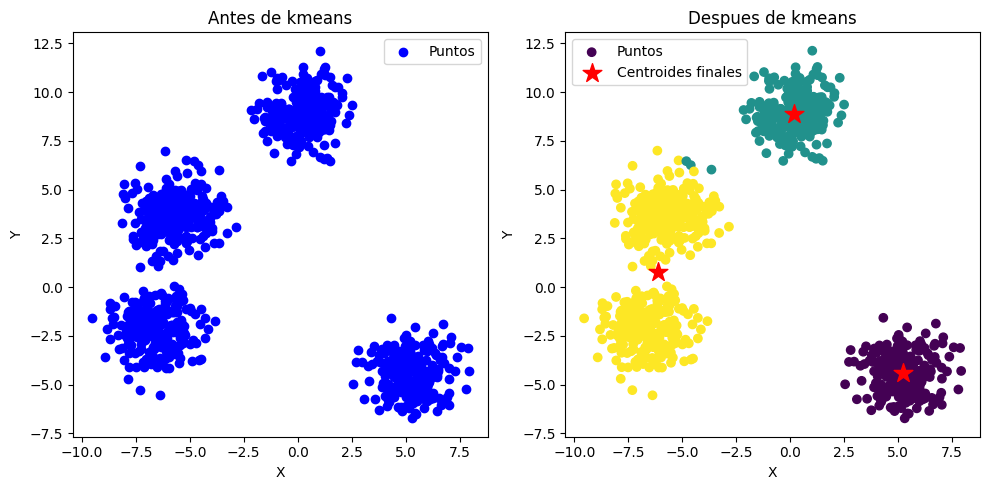

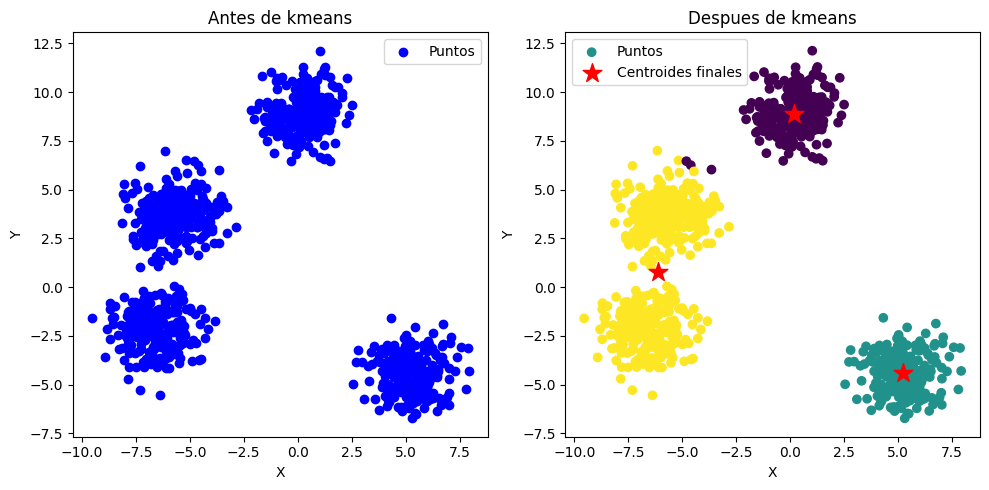

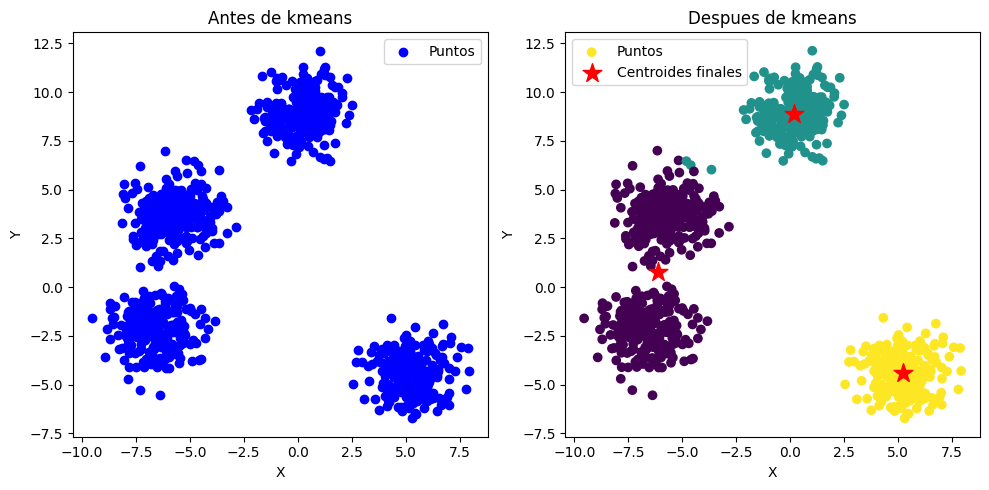

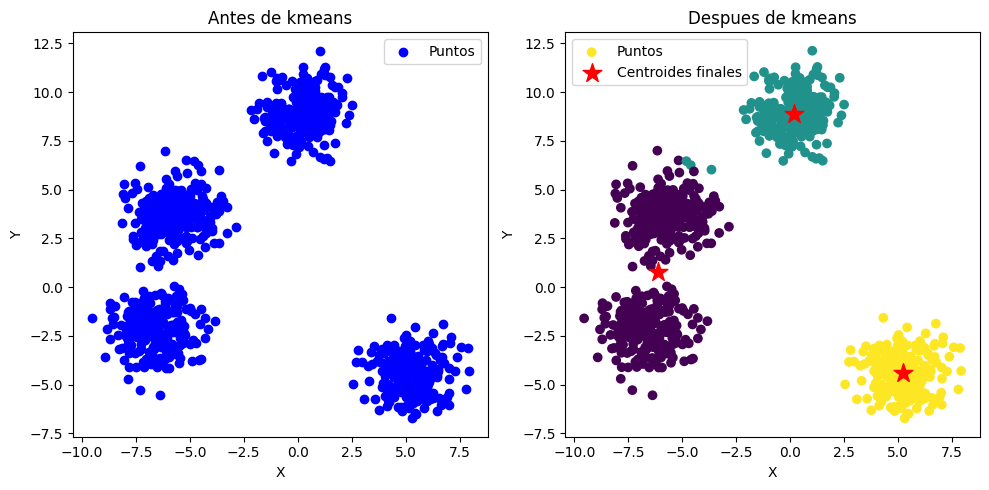

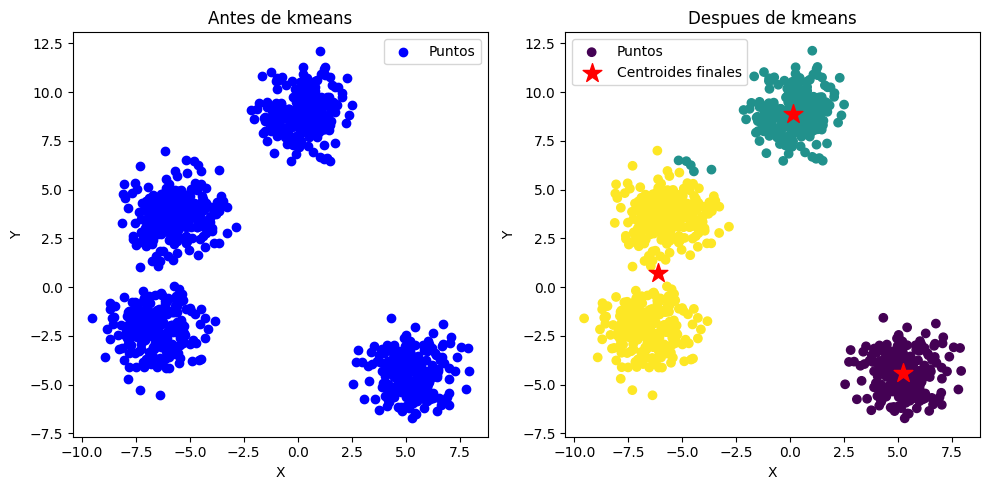

In [546]:
for i in range(5):
  kmeans = KMeans(k=3, max_iter=10000)
  labels = kmeans.run(points)
  dibujar2D(points, kmeans.centroids, labels)

# **Conclusion del experimento 4 (10000 iteraciones)**

en este experimento a partir de la tercera iteracion se nota un cambio en la ubicacion de los centroides, colocando el centroide superior en laparte inferior un poco cerca del centroide que ya estaba ubicado alli, tambien podemos observar que el centroide ubicado en la parte central izquiera se deslizo un poco hacia la derecha. y despues en la cuarta iteracion todos los centroides vuelven a como estaban en la segunda iteracion.

# **PUNTO 2**

In [547]:
from sklearn.datasets import make_blobs
points, y = make_blobs(n_samples = 1000,n_features = 3,centers = 4,random_state = 23)

In [548]:
kmeans = KMeans(k=3, max_iter=10)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[2 1 1 1 1 1 1 0 0 2 0 2 2 1 1 0 1 2 1 0 1 2 1 1 2 1 2 0 1 0 1 1 0 1 0 1 1
 0 1 2 1 1 1 1 1 0 2 0 1 0 1 1 0 1 1 0 1 2 0 1 0 0 1 1 2 1 1 0 1 1 0 1 0 1
 1 1 2 1 1 0 2 2 2 1 1 2 2 0 0 1 1 0 1 1 0 1 2 0 2 0 1 1 0 2 1 1 2 2 1 0 0
 2 1 2 0 2 1 0 2 1 2 1 1 2 0 2 1 0 1 1 1 0 1 1 1 1 0 1 0 1 2 0 0 2 0 0 2 2
 1 2 2 1 1 1 2 2 0 2 1 1 0 2 0 1 1 1 2 1 2 1 1 1 1 1 2 1 1 0 1 2 0 0 2 2 1
 1 0 1 1 1 2 0 2 2 1 2 0 2 1 1 1 0 2 2 0 1 1 0 0 0 1 1 1 2 1 2 2 0 2 1 1 0
 1 2 2 2 1 2 1 0 0 1 1 2 0 2 1 0 0 1 1 1 1 0 1 1 2 1 2 1 1 0 2 2 0 2 1 0 0
 1 2 2 0 0 0 1 2 1 2 2 1 2 2 2 0 1 1 2 2 1 1 1 0 0 2 2 0 1 0 0 1 1 0 0 0 2
 2 1 1 2 0 1 1 2 2 1 1 1 0 0 0 0 0 1 1 0 0 0 0 1 1 1 1 1 1 0 1 2 2 0 2 2 0
 1 1 1 1 0 2 2 1 1 2 1 0 1 0 1 1 2 0 2 2 2 2 1 2 1 1 2 1 2 1 2 1 2 2 2 2 1
 1 1 1 1 0 1 1 1 0 2 1 1 2 1 1 0 0 2 1 0 0 1 0 1 2 2 0 1 1 1 1 0 1 1 1 2 1
 0 1 0 1 1 1 2 1 1 1 1 0 2 0 0 2 1 0 1 1 2 1 0 1 2 1 2 1 2 1 1 0 1 1 1 1 0
 1 2 2 0 2 0 2 0 1 0 1 1 0 2 2 1 0 2 2 1 2 1 1 2 1 1 0 0 1 2 1 0 1 1 1 1 1
 2 2 0 2 2 1 2 2 2 2 0 1 

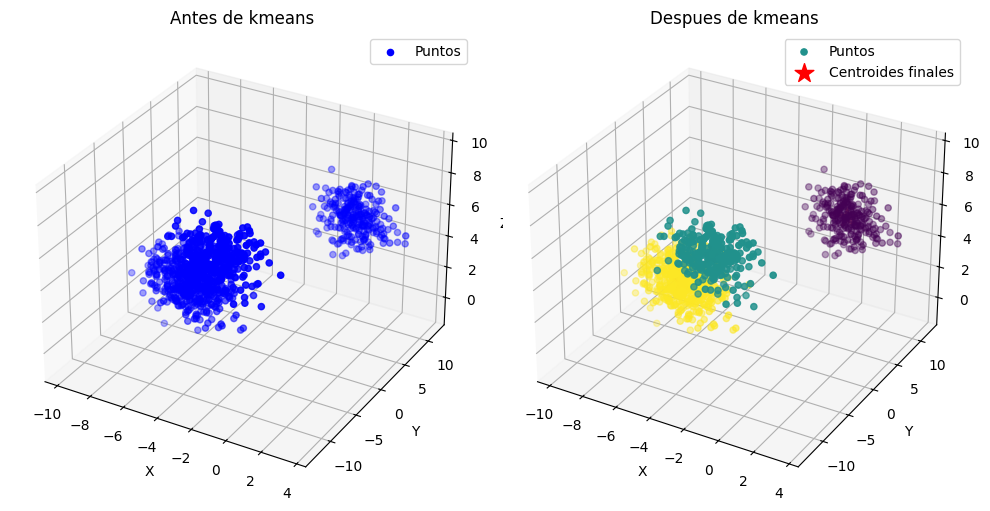

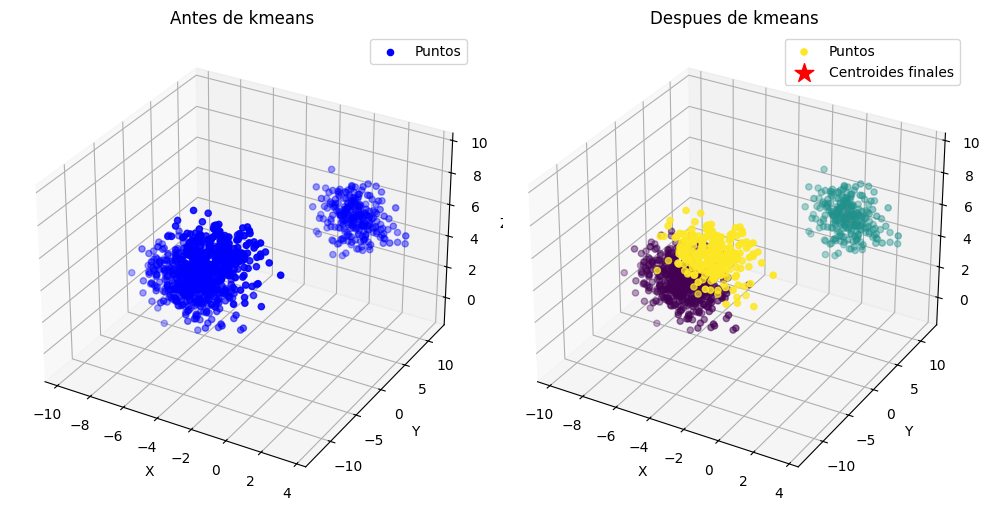

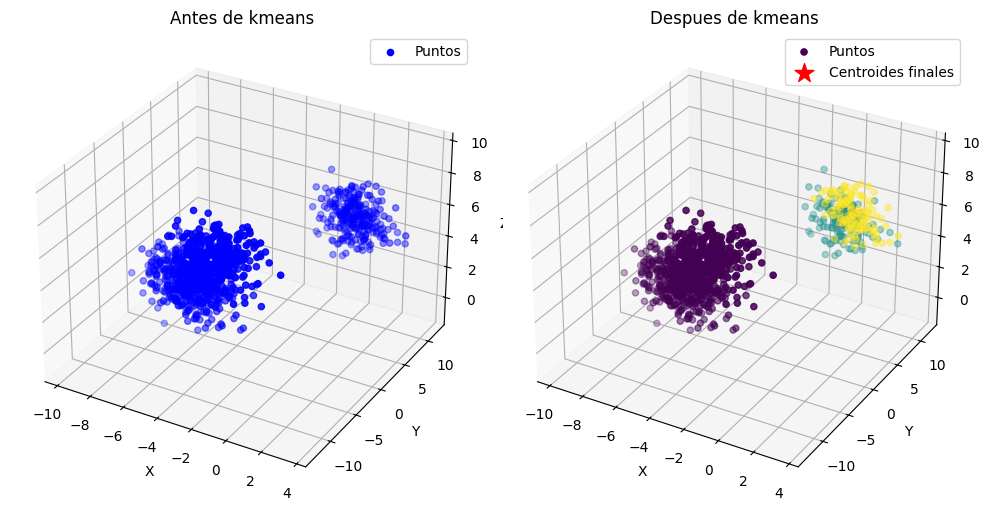

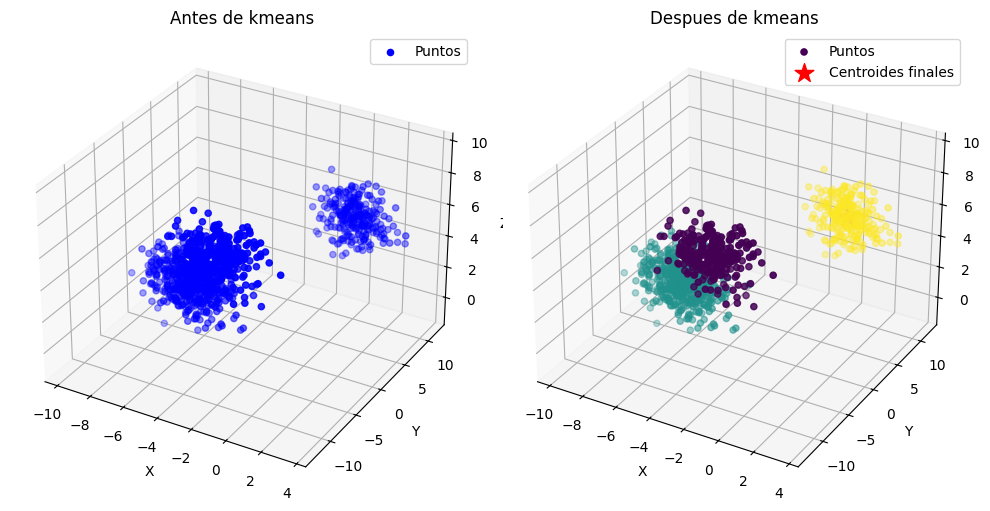

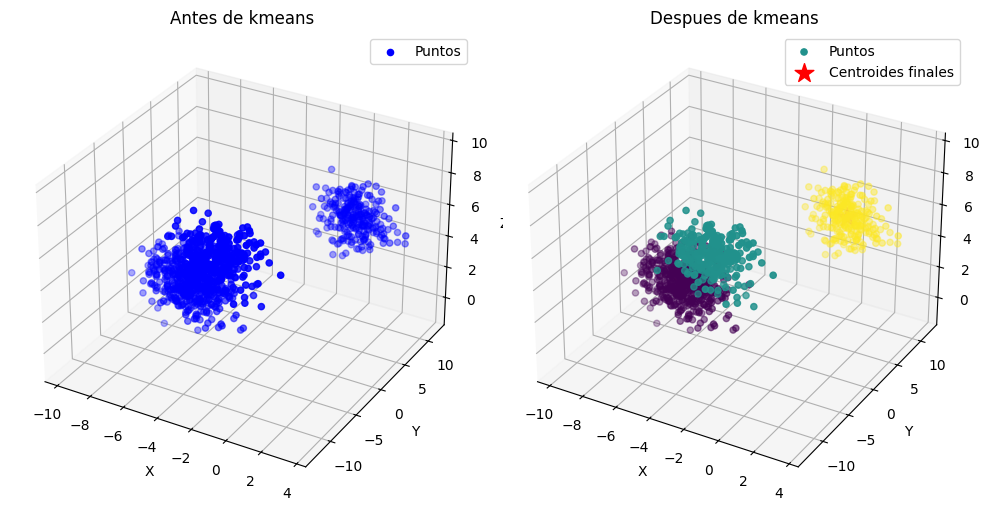

In [549]:
for i in range(5):
  kmeans = KMeans(k=3, max_iter=10)
  labels = kmeans.run(points)
  dibujar3D(points, kmeans.centroids, labels)

# **Conclusion (experimento 5)**

podemos observar que en el lado izquierdo que nos indica las graficas despues de kmeans, en la grafica 5 nos muestra una diferencia en la ubicacion de los centroides, colocando de esta manera los centroides juntos en laparte superior derecha mientras que las demas graficas los centroides tienen la misma ubicacion.

In [550]:
kmeans = KMeans(k=3, max_iter=100)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[2 1 1 1 1 1 1 0 0 2 0 2 2 1 1 0 1 2 1 0 1 2 1 1 2 1 2 0 1 0 1 1 0 1 0 1 1
 0 1 2 1 1 1 1 1 0 2 0 1 0 1 1 0 1 1 0 1 2 0 1 0 0 1 1 2 1 1 0 1 1 0 1 0 1
 1 1 2 1 1 0 2 2 2 1 1 2 2 0 0 1 1 0 1 1 0 1 2 0 2 0 1 1 0 2 1 1 2 2 1 0 0
 2 1 2 0 2 1 0 2 1 2 1 1 2 0 2 1 0 1 1 1 0 1 1 1 1 0 1 0 1 2 0 0 2 0 0 2 2
 1 2 2 1 1 1 2 2 0 2 1 1 0 2 0 1 1 1 2 1 2 1 1 1 1 1 2 1 1 0 1 2 0 0 2 2 1
 1 0 1 1 1 2 0 2 2 1 2 0 2 1 1 1 0 2 2 0 1 1 0 0 0 1 1 1 2 1 2 2 0 2 1 1 0
 1 2 2 2 1 2 1 0 0 1 1 2 0 2 1 0 0 1 1 1 1 0 1 1 2 1 2 1 1 0 2 2 0 2 1 0 0
 1 2 2 0 0 0 1 2 1 2 2 1 2 2 2 0 1 1 2 2 1 1 1 0 0 2 2 0 1 0 0 1 1 0 0 0 2
 2 1 1 2 0 1 1 2 2 1 1 1 0 0 0 0 0 1 1 0 0 0 0 1 1 1 1 1 1 0 1 2 2 0 2 2 0
 1 1 1 1 0 2 2 1 1 2 1 0 1 0 1 1 2 0 2 2 2 2 1 2 1 1 2 1 2 1 2 1 2 2 2 2 1
 1 1 1 1 0 1 1 1 0 2 1 1 2 1 1 0 0 2 1 0 0 1 0 1 2 2 0 1 1 1 1 0 1 1 1 2 1
 0 1 0 1 1 1 2 1 1 1 1 0 2 0 0 2 1 0 1 1 2 1 0 1 2 1 2 1 2 1 1 0 1 1 1 1 0
 1 2 2 0 2 0 2 0 1 0 1 1 0 2 2 1 0 2 2 1 2 1 1 2 1 1 0 0 1 2 1 0 1 1 1 1 1
 2 2 0 2 2 1 2 2 2 2 0 1 

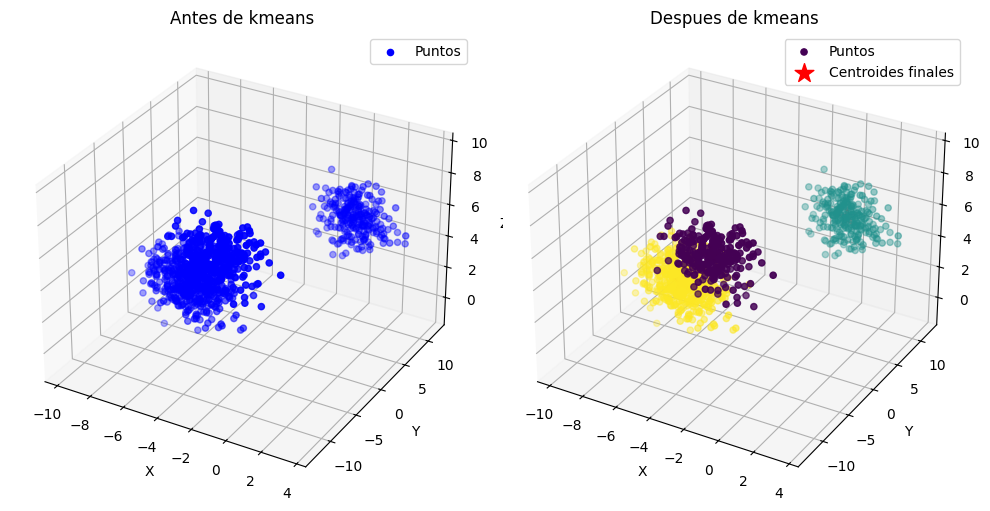

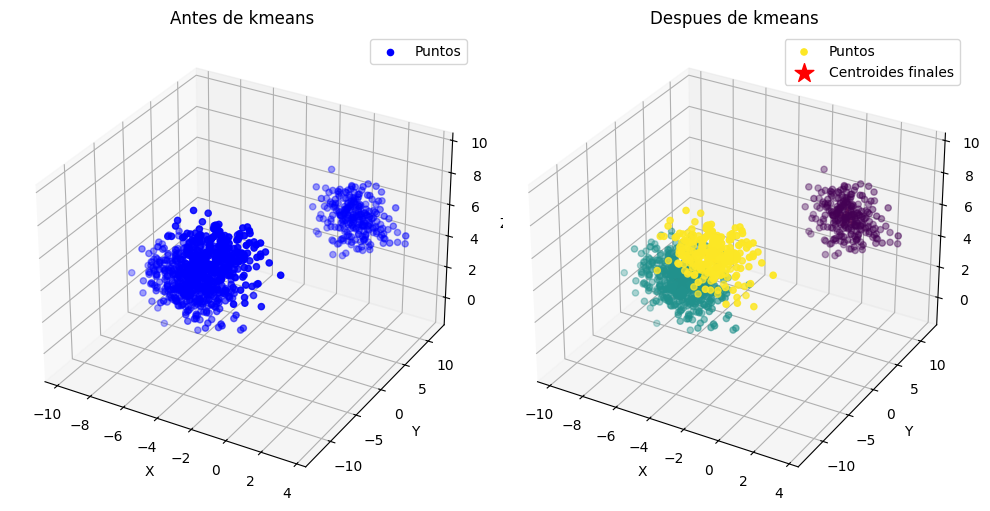

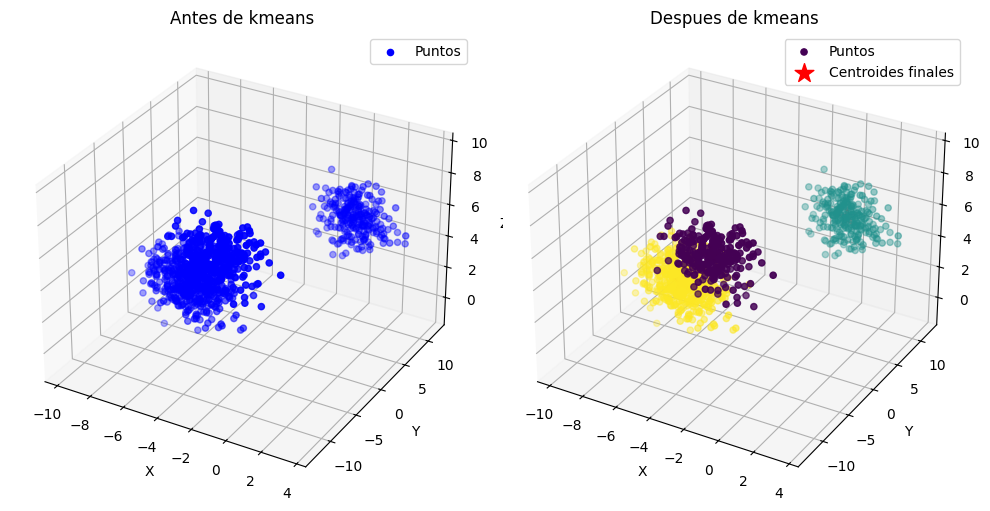

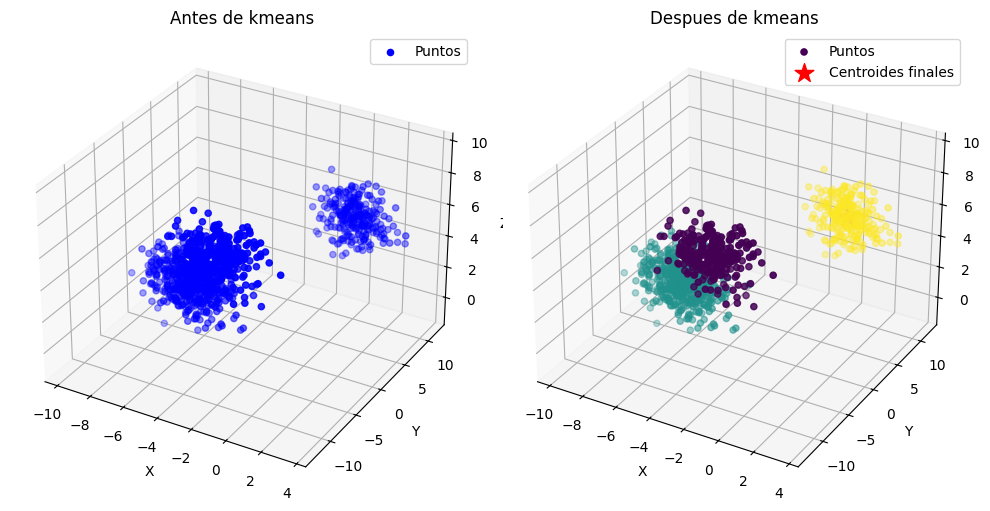

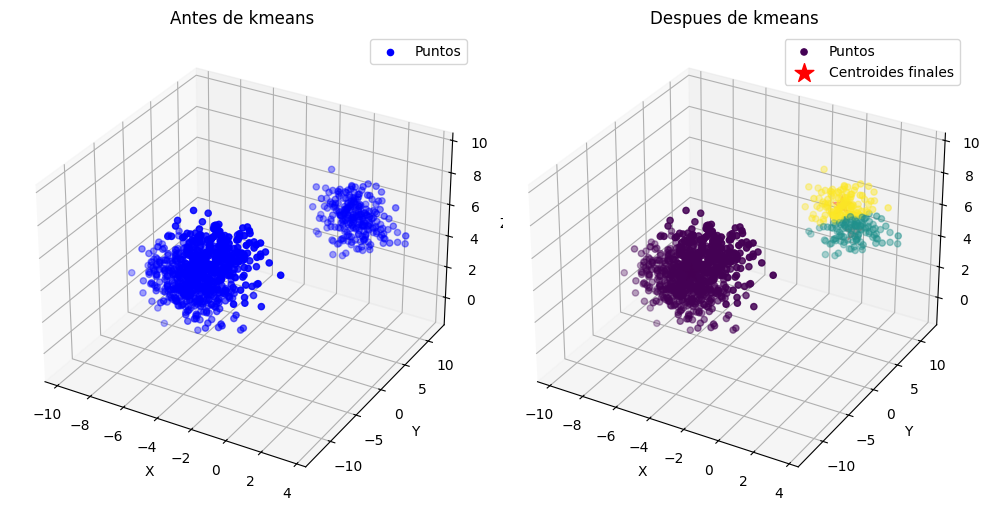

In [551]:
for i in range(5):
  kmeans = KMeans(k=3, max_iter=100)
  labels = kmeans.run(points)
  dibujar3D(points, kmeans.centroids, labels)


# **Conclusion (experimento 6)**

podemos concluir que el centroide tienen la misma ubicacion en las grafica de tal manera no hay ningun cambio de ubicacion.

In [552]:
kmeans = KMeans(k=3, max_iter=1000)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[1 0 0 0 0 0 0 2 2 1 2 1 1 0 0 2 0 1 0 2 0 1 0 0 1 0 1 2 0 2 0 0 2 0 2 0 0
 2 0 1 0 0 0 0 0 2 1 2 0 2 0 0 2 0 0 2 0 1 2 0 2 2 0 0 1 0 0 2 0 0 2 0 2 0
 0 0 1 0 0 2 1 1 1 0 0 1 1 2 2 0 0 2 0 0 2 0 1 2 1 2 0 0 2 1 0 0 1 1 0 2 2
 1 0 1 2 1 0 2 1 0 1 0 0 1 2 1 0 2 0 0 0 2 0 0 0 0 2 0 2 0 1 2 2 1 2 2 1 1
 0 1 1 0 0 0 1 1 2 1 0 0 2 1 2 0 0 0 1 0 1 0 0 0 0 0 1 0 0 2 0 1 2 2 1 1 0
 0 2 0 0 0 1 2 1 1 0 1 2 1 0 0 0 2 1 1 2 0 0 2 2 2 0 0 0 1 0 1 1 2 1 0 0 2
 0 1 1 1 0 1 0 2 2 0 0 1 2 1 0 2 2 0 0 0 0 2 0 0 1 0 1 0 0 2 1 1 2 1 0 2 2
 0 1 1 2 2 2 0 1 0 1 1 0 1 1 1 2 0 0 1 1 0 0 0 2 2 1 1 2 0 2 2 0 0 2 2 2 1
 1 0 0 1 2 0 0 1 1 0 0 0 2 2 2 2 2 0 0 2 2 2 2 0 0 0 0 0 0 2 0 1 1 2 1 1 2
 0 0 0 0 2 1 1 0 0 1 0 2 0 2 0 0 1 2 1 1 1 1 0 1 0 0 1 0 1 0 1 0 1 1 1 1 0
 0 0 0 0 2 0 0 0 2 1 0 0 1 0 0 2 2 1 0 2 2 0 2 0 1 1 2 0 0 0 0 2 0 0 0 1 0
 2 0 2 0 0 0 1 0 0 0 0 2 1 2 2 1 0 2 0 0 1 0 2 0 1 0 1 0 1 0 0 2 0 0 0 0 2
 0 1 1 2 1 2 1 2 0 2 0 0 2 1 1 0 2 1 1 0 1 0 0 1 0 0 2 2 0 1 0 2 0 0 0 0 0
 1 1 2 1 1 0 1 1 1 1 2 0 

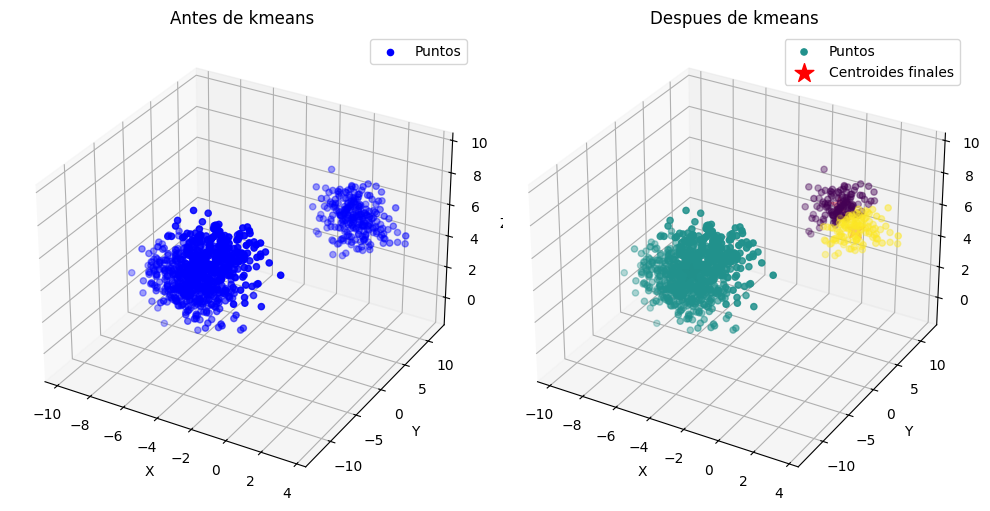

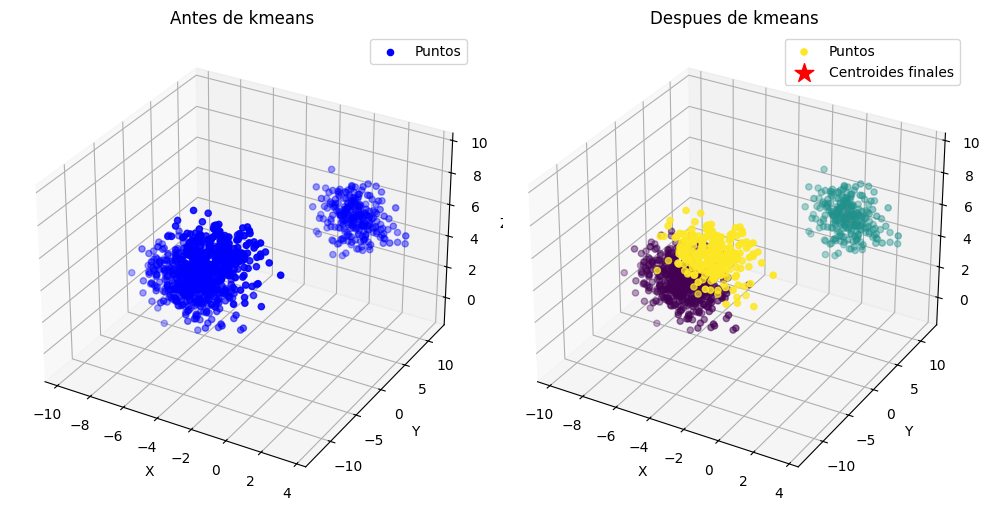

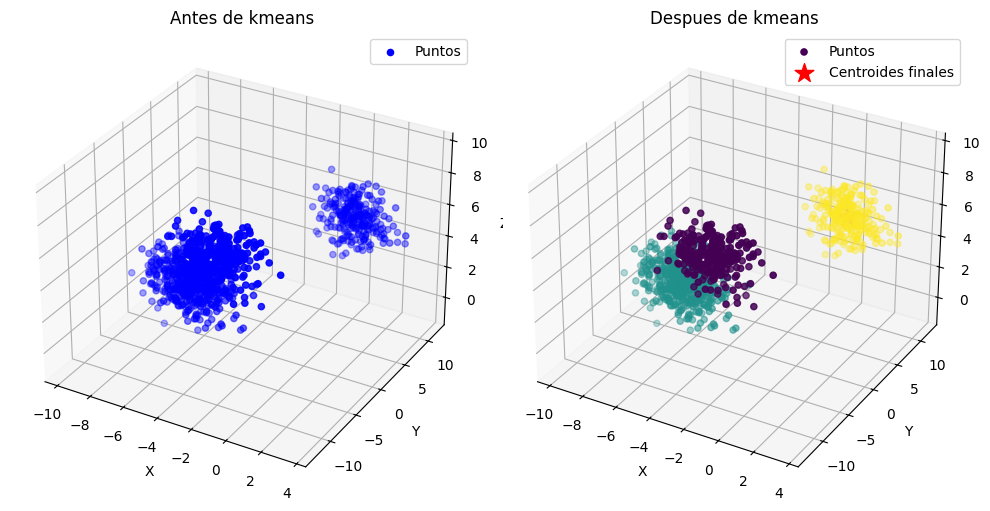

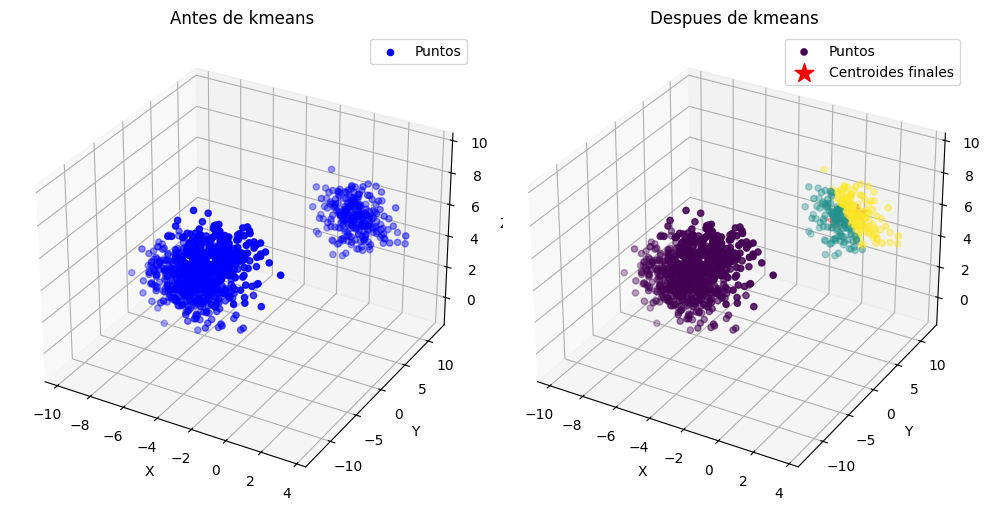

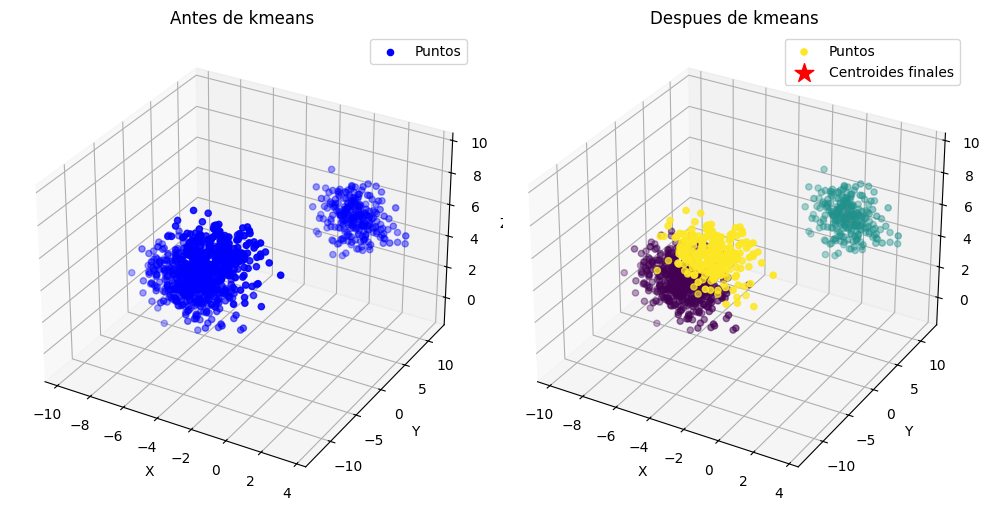

In [553]:
for i in range(5):
  kmeans = KMeans(k=3, max_iter=1000)
  labels = kmeans.run(points)
  dibujar3D(points, kmeans.centroids, labels)


# **Conclusion (experimento 7)**

podemos observar los diferentes cambios que tuvieron los centroides con respecto a cada grafica, de tal manera que despues de realizar dicho cambio, vuelva a estar en la ubicacion de la grafica antes de realizar el cambio.

In [554]:
kmeans = KMeans(k=3, max_iter=10000)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[1 0 0 0 0 0 0 2 2 1 2 1 1 0 0 2 0 1 0 2 0 1 0 0 1 0 1 2 0 2 0 0 2 0 2 0 0
 2 0 1 0 0 0 0 0 2 1 2 0 2 0 0 2 0 0 2 0 1 2 0 2 2 0 0 1 0 0 2 0 0 2 0 2 0
 0 0 1 0 0 2 1 1 1 0 0 1 1 2 2 0 0 2 0 0 2 0 1 2 1 2 0 0 2 1 0 0 1 1 0 2 2
 1 0 1 2 1 0 2 1 0 1 0 0 1 2 1 0 2 0 0 0 2 0 0 0 0 2 0 2 0 1 2 2 1 2 2 1 1
 0 1 1 0 0 0 1 1 2 1 0 0 2 1 2 0 0 0 1 0 1 0 0 0 0 0 1 0 0 2 0 1 2 2 1 1 0
 0 2 0 0 0 1 2 1 1 0 1 2 1 0 0 0 2 1 1 2 0 0 2 2 2 0 0 0 1 0 1 1 2 1 0 0 2
 0 1 1 1 0 1 0 2 2 0 0 1 2 1 0 2 2 0 0 0 0 2 0 0 1 0 1 0 0 2 1 1 2 1 0 2 2
 0 1 1 2 2 2 0 1 0 1 1 0 1 1 1 2 0 0 1 1 0 0 0 2 2 1 1 2 0 2 2 0 0 2 2 2 1
 1 0 0 1 2 0 0 1 1 0 0 0 2 2 2 2 2 0 0 2 2 2 2 0 0 0 0 0 0 2 0 1 1 2 1 1 2
 0 0 0 0 2 1 1 0 0 1 0 2 0 2 0 0 1 2 1 1 1 1 0 1 0 0 1 0 1 0 1 0 1 1 1 1 0
 0 0 0 0 2 0 0 0 2 1 0 0 1 0 0 2 2 1 0 2 2 0 2 0 1 1 2 0 0 0 0 2 0 0 0 1 0
 2 0 2 0 0 0 1 0 0 0 0 2 1 2 2 1 0 2 0 0 1 0 2 0 1 0 1 0 1 0 0 2 0 0 0 0 2
 0 1 1 2 1 2 1 2 0 2 0 0 2 1 1 0 2 1 1 0 1 0 0 1 0 0 2 2 0 1 0 2 0 0 0 0 0
 1 1 2 1 1 0 1 1 1 1 2 0 

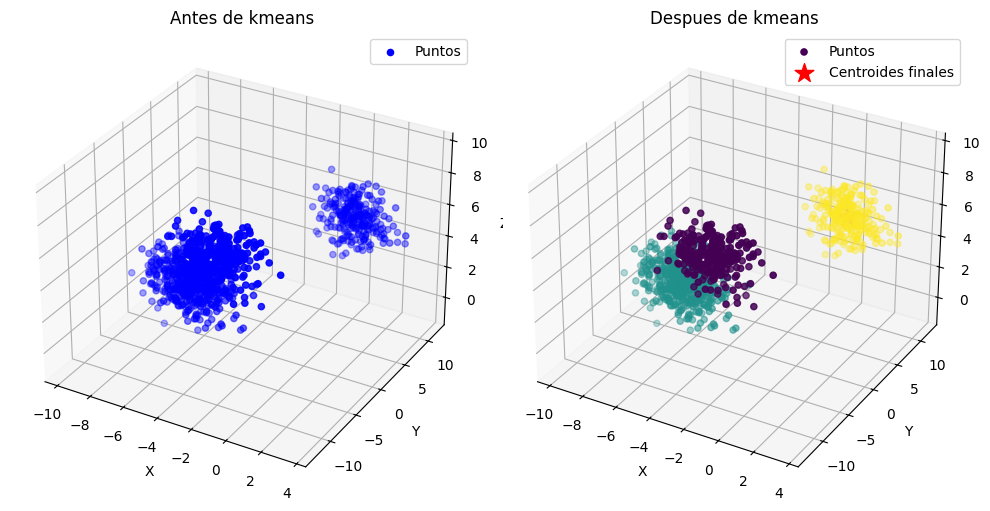

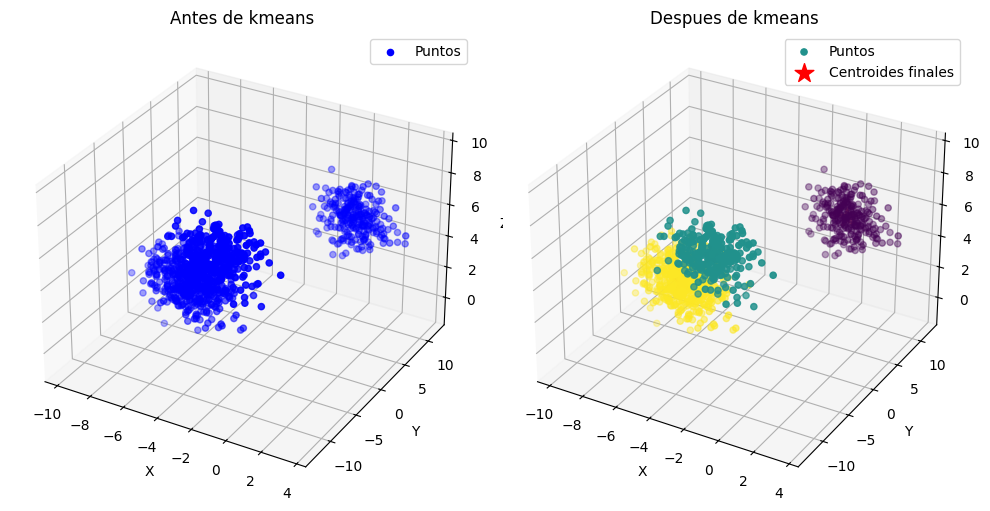

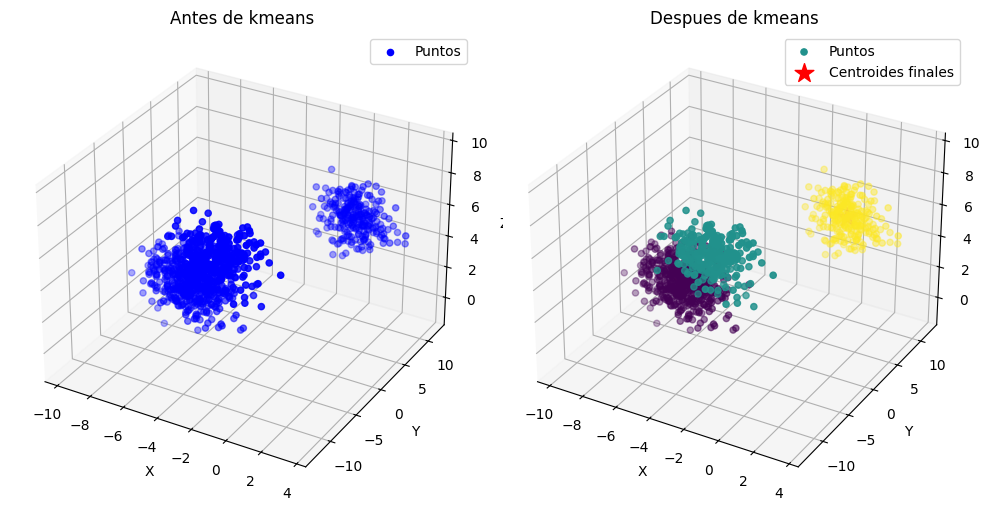

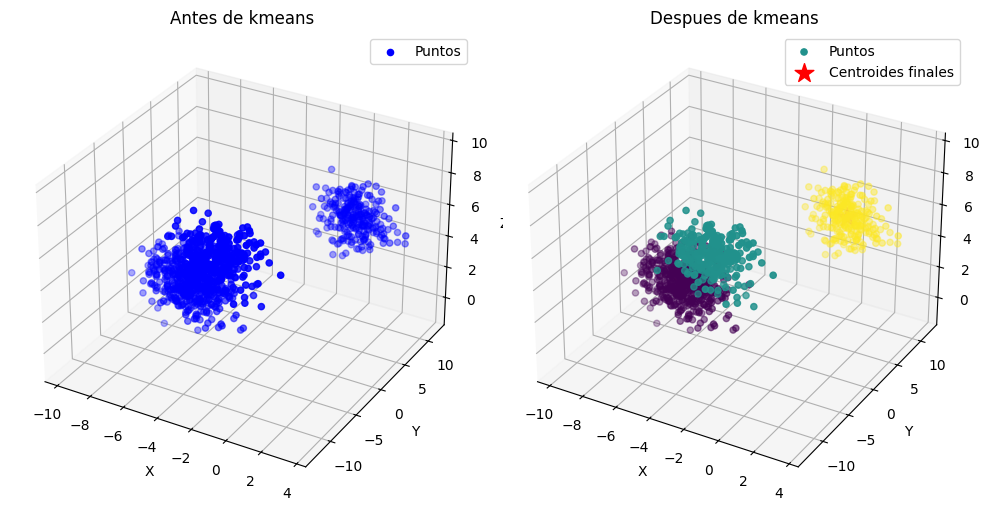

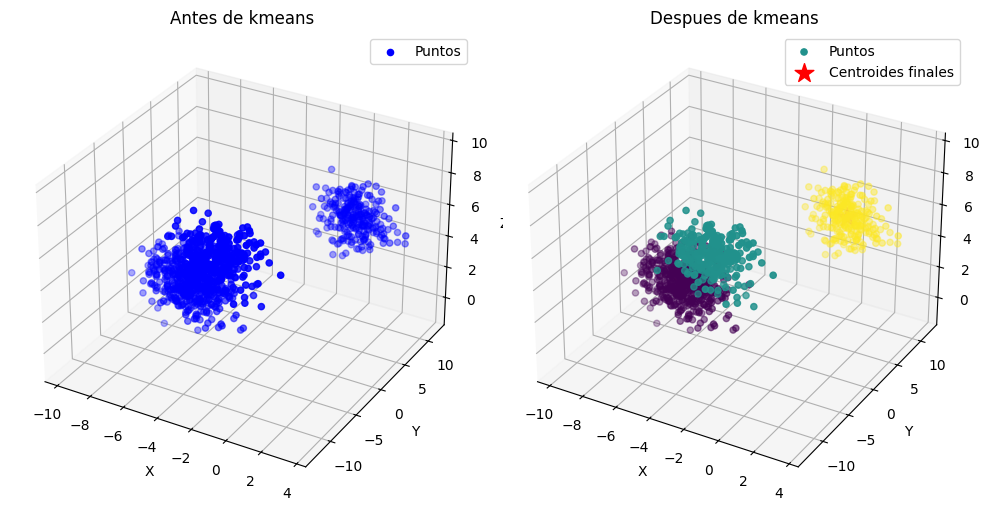

In [555]:
for i in range(5):
  kmeans = KMeans(k=3, max_iter=10000)
  labels = kmeans.run(points)
  dibujar3D(points, kmeans.centroids, labels)


# **conclusion (experimento 8)**

en este punto podemos observar que del lado derecho se muestran las graficas despues de kmeans con los cambios obtenidos con respecto a los datos asignados, en este caso hacemos 3 clusters con 10 mil iteraciones en una grafica 3d que nos visualice los diferentes cambios que pueden llegar a tener lois centroides y la manera en como cambian los clusters.

# **PUNTO 3**

In [556]:
from sklearn.datasets import make_blobs
points, y = make_blobs(n_samples = 1000,n_features =10 ,centers = 4,random_state = 23)

In [557]:
for i in range(5):
  kmeans = KMeans(k=3, max_iter=10)
  labels = kmeans.run(points)
  print(labels)
  print(kmeans.centroids)

[0 2 1 0 2 0 0 0 2 0 0 0 0 2 0 0 2 1 0 0 0 2 0 1 0 0 1 0 0 2 1 0 0 0 0 0 1
 0 0 2 0 2 0 0 0 0 0 1 1 0 0 2 0 1 2 0 1 0 2 1 0 0 0 1 1 0 0 0 2 2 2 0 0 1
 1 2 0 0 1 1 1 0 2 2 0 0 1 2 1 0 0 1 0 0 2 2 0 1 0 2 0 0 0 0 0 0 2 2 0 0 0
 0 0 0 0 0 1 0 2 1 0 0 2 2 0 0 0 0 1 0 2 2 0 1 0 1 1 0 0 0 1 2 0 0 0 0 0 2
 0 2 2 0 1 0 0 2 1 0 0 0 0 1 0 2 0 0 1 0 2 1 0 2 1 1 1 0 0 0 2 1 1 0 2 0 1
 0 1 2 1 2 1 0 0 2 0 0 1 2 1 0 0 2 1 0 2 0 1 0 0 0 0 0 2 1 1 1 0 1 0 2 1 0
 0 0 0 0 0 0 0 0 0 1 0 2 0 0 2 1 2 1 2 2 0 0 0 1 0 0 0 0 1 2 2 2 1 0 0 1 2
 1 0 0 1 2 0 2 2 2 0 1 0 1 2 0 2 0 0 0 1 2 2 0 0 0 1 0 2 2 1 0 2 1 2 2 1 0
 1 0 1 2 2 2 2 1 2 2 2 1 1 0 1 0 2 2 0 0 0 0 0 0 1 0 2 0 1 0 0 2 0 0 1 2 0
 0 2 1 2 1 1 0 1 0 0 1 0 2 0 0 1 1 0 1 0 0 2 0 0 0 1 2 0 2 2 1 2 1 2 2 0 1
 0 0 0 0 0 0 0 1 0 2 1 1 1 1 2 0 2 0 0 0 2 0 0 0 0 2 2 1 2 0 1 0 1 0 2 0 0
 0 1 0 0 1 2 0 2 0 0 2 2 2 1 2 1 0 1 0 0 0 1 0 1 0 0 2 0 2 2 0 1 0 0 2 0 2
 0 2 0 2 0 2 0 1 0 2 0 0 2 0 0 1 0 2 1 2 1 2 0 0 1 0 1 2 2 1 0 0 1 0 2 2 2
 2 1 2 1 1 0 1 2 1 2 0 1 

# *Conclusion (experimento 9)*
 este resultado nos muestra la agrupación de datos en tres clusters, donde cada cluster tiene un centroide que representa el punto medio de los datos asignados. Por lo tanto podemos definir que la asignación de algunos puntos cambia debido a que los centroides se inicializan de manera aleatoria.

In [558]:
for i in range(5):
  kmeans = KMeans(k=3, max_iter=100)
  labels = kmeans.run(points)
  print(labels)
  print(kmeans.centroids)

[2 1 0 2 1 2 2 2 1 2 2 2 2 1 2 2 1 0 2 2 2 1 2 0 2 2 0 2 2 1 0 2 2 2 2 2 0
 2 2 1 2 1 2 2 2 2 2 0 0 2 2 1 2 0 1 2 0 2 1 0 2 2 2 0 0 2 2 2 1 1 1 2 2 0
 0 1 2 2 0 0 0 2 1 1 2 2 0 1 0 2 2 0 2 2 1 1 2 0 2 1 2 2 2 2 2 2 1 1 2 2 2
 2 2 2 2 2 0 2 1 0 2 2 1 1 2 2 2 2 0 2 1 1 2 0 2 0 0 2 2 2 0 1 2 2 2 2 2 1
 2 1 1 2 0 2 2 1 0 2 2 2 2 0 2 1 2 2 0 2 1 0 2 1 0 0 0 2 2 2 1 0 0 2 1 2 0
 2 0 1 0 1 0 2 2 1 2 2 0 1 0 2 2 1 0 2 1 2 0 2 2 2 2 2 1 0 0 0 2 0 2 1 0 2
 2 2 2 2 2 2 2 2 2 0 2 1 2 2 1 0 1 0 1 1 2 2 2 0 2 2 2 2 0 1 1 1 0 2 2 0 1
 0 2 2 0 1 2 1 1 1 2 0 2 0 1 2 1 2 2 2 0 1 1 2 2 2 0 2 1 1 0 2 1 0 1 1 0 2
 0 2 0 1 1 1 1 0 1 1 1 0 0 2 0 2 1 1 2 2 2 2 2 2 0 2 1 2 0 2 2 1 2 2 0 1 2
 2 1 0 1 0 0 2 0 2 2 0 2 1 2 2 0 0 2 0 2 2 1 2 2 2 0 1 2 1 1 0 1 0 1 1 2 0
 2 2 2 2 2 2 2 0 2 1 0 0 0 0 1 2 1 2 2 2 1 2 2 2 2 1 1 0 1 2 0 2 0 2 1 2 2
 2 0 2 2 0 1 2 1 2 2 1 1 1 0 1 0 2 0 2 2 2 0 2 0 2 2 1 2 1 1 2 0 2 2 1 2 1
 2 1 2 1 2 1 2 0 2 1 2 2 1 2 2 0 2 1 0 1 0 1 2 2 0 2 0 1 1 0 2 2 0 2 1 1 1
 1 0 1 0 0 2 0 1 0 1 2 0 

# **Conclusión (experimento 10)**

El código se ejecuta cinco veces con k=3 clusters es decir, 3 agrupaciones y con un total de 100 iteraciones, el cual puede generar resultados inconsistentes debido a que la inicialización de los centroides es aleatoria.

In [559]:
for i in range(5):
  kmeans = KMeans(k=3, max_iter=1000)
  labels = kmeans.run(points)
  print(labels)
  print(kmeans.centroids)

[1 2 2 1 2 1 1 1 2 0 1 1 1 2 0 0 2 2 0 0 0 2 0 2 1 1 2 0 1 2 2 0 0 0 0 1 2
 1 1 2 0 2 1 0 1 0 0 2 2 0 0 2 0 2 2 0 2 1 2 2 0 1 0 2 2 0 0 0 2 2 2 0 1 2
 2 2 1 0 2 2 2 0 2 2 0 1 2 2 2 0 0 2 0 0 2 2 1 2 0 2 1 1 0 0 0 0 2 2 1 0 0
 1 0 1 0 0 2 1 2 2 0 1 2 2 1 1 0 0 2 0 2 2 1 2 0 2 2 1 0 0 2 2 0 0 0 0 0 2
 0 2 2 0 2 1 1 2 2 1 0 1 0 2 1 2 1 1 2 0 2 2 0 2 2 2 2 1 0 1 2 2 2 1 2 0 2
 1 2 2 2 2 2 1 1 2 1 0 2 2 2 1 0 2 2 0 2 1 2 0 0 0 0 0 2 2 2 2 1 2 1 2 2 0
 0 0 1 0 1 0 0 0 0 2 0 2 1 0 2 2 2 2 2 2 1 1 1 2 0 0 1 0 2 2 2 2 2 1 1 2 2
 2 0 1 2 2 0 2 2 2 1 2 1 2 2 0 2 0 0 1 2 2 2 1 1 0 2 0 2 2 2 1 2 2 2 2 2 1
 2 0 2 2 2 2 2 2 2 2 2 2 2 1 2 1 2 2 0 0 1 0 1 1 2 1 2 1 2 0 1 2 1 0 2 2 1
 1 2 2 2 2 2 1 2 0 1 2 1 2 0 1 2 2 0 2 0 0 2 1 1 1 2 2 0 2 2 2 2 2 2 2 0 2
 0 0 1 0 0 0 0 2 0 2 2 2 2 2 2 1 2 1 0 0 2 0 0 0 0 2 2 2 2 1 2 0 2 0 2 0 0
 1 2 1 0 2 2 1 2 0 1 2 2 2 2 2 2 1 2 1 1 0 2 0 2 1 1 2 0 2 2 0 2 1 1 2 1 2
 0 2 1 2 1 2 0 2 1 2 1 0 2 1 1 2 0 2 2 2 2 2 1 0 2 1 2 2 2 2 1 0 2 1 2 2 2
 2 2 2 2 2 1 2 2 2 2 1 2 

# **conclusión (experimento 11)**

podemos concluir que hay una grupacion en 3 cluters en donde hay una concentracion de datos en la categoria 2 mientras que en la categoria 0 y 1 solo hay una pequeña parte de los datos.

In [560]:
for i in range(5):
  kmeans = KMeans(k=3, max_iter=10000)
  labels = kmeans.run(points)
  print(labels)
  print(kmeans.centroids)

[2 1 0 2 1 2 2 2 1 2 2 2 2 1 2 2 1 0 2 2 2 1 2 0 2 2 0 2 2 1 0 2 2 2 2 2 0
 2 2 1 2 1 2 2 2 2 2 0 0 2 2 1 2 0 1 2 0 2 1 0 2 2 2 0 0 2 2 2 1 1 1 2 2 0
 0 1 2 2 0 0 0 2 1 1 2 2 0 1 0 2 2 0 2 2 1 1 2 0 2 1 2 2 2 2 2 2 1 1 2 2 2
 2 2 2 2 2 0 2 1 0 2 2 1 1 2 2 2 2 0 2 1 1 2 0 2 0 0 2 2 2 0 1 2 2 2 2 2 1
 2 1 1 2 0 2 2 1 0 2 2 2 2 0 2 1 2 2 0 2 1 0 2 1 0 0 0 2 2 2 1 0 0 2 1 2 0
 2 0 1 0 1 0 2 2 1 2 2 0 1 0 2 2 1 0 2 1 2 0 2 2 2 2 2 1 0 0 0 2 0 2 1 0 2
 2 2 2 2 2 2 2 2 2 0 2 1 2 2 1 0 1 0 1 1 2 2 2 0 2 2 2 2 0 1 1 1 0 2 2 0 1
 0 2 2 0 1 2 1 1 1 2 0 2 0 1 2 1 2 2 2 0 1 1 2 2 2 0 2 1 1 0 2 1 0 1 1 0 2
 0 2 0 1 1 1 1 0 1 1 1 0 0 2 0 2 1 1 2 2 2 2 2 2 0 2 1 2 0 2 2 1 2 2 0 1 2
 2 1 0 1 0 0 2 0 2 2 0 2 1 2 2 0 0 2 0 2 2 1 2 2 2 0 1 2 1 1 0 1 0 1 1 2 0
 2 2 2 2 2 2 2 0 2 1 0 0 0 0 1 2 1 2 2 2 1 2 2 2 2 1 1 0 1 2 0 2 0 2 1 2 2
 2 0 2 2 0 1 2 1 2 2 1 1 1 0 1 0 2 0 2 2 2 0 2 0 2 2 1 2 1 1 2 0 2 2 1 2 1
 2 1 2 1 2 1 2 0 2 1 2 2 1 2 2 0 2 1 0 1 0 1 2 2 0 2 0 1 1 0 2 2 0 2 1 1 1
 1 0 1 0 0 2 0 1 0 1 2 0 

# **Conclusión (experimento 12)**

concluimos que hay una frecuencia en el valor 1, por otro lado los valores de 0 y 2 estan equilibrados es decir, no hay un sesgo hacia los extremos.

# **PUNTO 4**

In [561]:
from sklearn.datasets import make_blobs
points, y = make_blobs(n_samples = 1000,n_features =100 ,centers = 4,random_state = 23)

In [562]:
for i in range(5):
  kmeans = KMeans(k=3, max_iter=10)
  labels = kmeans.run(points)
  print(labels)
  print(kmeans.centroids)

[2 0 1 0 0 0 1 2 1 1 2 0 0 1 1 1 0 1 1 0 1 1 2 0 2 0 1 1 1 2 1 0 1 1 1 1 1
 1 1 0 1 2 1 2 1 1 0 1 2 2 2 2 2 1 1 1 1 1 0 1 2 1 2 1 1 1 1 1 2 0 0 1 1 1
 2 2 1 1 1 1 2 1 1 1 1 2 1 1 2 0 0 1 2 0 1 1 1 1 0 0 1 1 1 1 0 2 1 0 0 0 2
 0 2 1 1 1 0 1 0 2 1 0 1 2 2 0 0 2 1 1 2 1 1 0 1 0 1 2 0 2 0 0 0 1 1 1 0 1
 0 2 1 0 2 2 1 0 1 0 0 1 2 1 1 2 1 2 1 0 1 0 1 2 1 0 1 0 2 1 1 0 2 2 1 2 0
 1 2 0 0 1 1 2 1 0 2 0 0 2 1 2 2 2 1 1 0 1 0 1 1 0 0 1 1 1 1 1 0 1 1 1 1 1
 2 1 2 1 2 2 1 1 1 1 1 1 2 1 1 0 1 1 1 0 1 2 1 2 1 1 1 0 1 1 0 1 0 0 1 1 1
 1 2 0 2 2 0 0 0 0 1 1 1 0 1 1 2 2 0 1 0 0 0 1 2 0 2 2 1 2 0 1 0 1 1 1 2 0
 1 1 1 1 2 2 2 2 2 1 1 2 1 2 1 1 1 0 2 2 0 1 2 1 2 1 1 1 1 0 1 1 2 1 0 1 0
 1 1 1 0 1 0 0 1 1 1 0 1 2 0 1 1 1 0 2 2 1 1 2 1 2 1 1 0 2 1 1 0 1 2 1 1 1
 2 2 0 1 1 0 1 2 1 0 1 1 2 1 1 1 2 0 2 1 1 1 1 2 2 2 1 1 1 1 1 1 0 0 1 2 2
 0 2 1 1 2 2 1 1 2 1 1 1 2 1 2 0 0 1 1 1 1 1 0 0 1 1 1 1 0 1 1 1 1 0 0 1 2
 0 1 2 0 0 1 2 1 2 1 0 1 0 0 0 1 1 2 0 0 1 2 0 2 1 0 2 1 2 1 2 0 2 1 0 1 1
 0 1 0 0 2 1 1 1 0 2 1 1 

# **Conclusión (experimento 13)**

podemos observar que hay una agrupacion de 3 y debido a la inicialización aleatoria de los centroides, los resultados varían en cada ejecución, lo que indica que el algoritmo converge a diferentes soluciones.

In [563]:
kmeans = KMeans(k=3, max_iter=100)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[0 1 0 1 1 1 0 0 0 0 0 1 1 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 1 1 0 0 0 0 1 0 0 1 1 1 0
 1 0 0 0 0 1 0 1 0 0 1 0 0 0 1 1 0 0 0 0 0 0 1 0 1 0 0 1 0 1 1 1 0 0 0 1 0
 1 0 0 1 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1
 0 0 1 1 0 0 0 0 1 0 1 1 0 0 0 0 0 0 0 1 0 1 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 1 0 0 0
 0 0 1 0 0 1 1 1 1 0 0 0 1 0 0 0 0 1 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1
 0 0 0 1 0 1 1 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 0
 1 0 0 1 1 0 0 0 0 0 1 0 1 1 1 0 0 0 1 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0
 1 0 1 1 0 0 0 0 1 0 0 0 

# **Conclusión (experimento 14)**

Después de 100 iteraciones, el algoritmo asignó una etiqueta a cada punto (0, 1 o 2), lo que indica a qué grupo pertenece cada dato. Además, generó tres centroides, que representan el centro de cada clúster en el espacio de características. Por lo tanto, se logró encontrar patrones dentro de los datos y clasificarlos en tres grupos distintos.

In [564]:
kmeans = KMeans(k=3, max_iter=1000)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[0 0 2 0 0 0 2 0 2 2 0 0 0 2 2 1 0 1 1 0 1 2 0 0 0 0 1 2 2 0 1 0 2 1 1 1 1
 1 1 0 1 0 1 0 1 2 0 1 0 0 0 0 0 1 1 2 1 1 0 1 0 1 0 2 1 1 2 2 0 0 0 2 2 2
 0 0 2 2 2 1 0 2 1 1 1 0 1 1 0 0 0 2 0 0 1 2 1 2 0 0 1 2 2 2 0 0 2 0 0 0 0
 0 0 2 2 2 0 1 0 0 2 0 1 0 0 0 0 0 2 1 0 1 2 0 2 0 1 0 0 0 0 0 0 2 1 1 0 1
 0 0 1 0 0 0 2 0 2 0 0 1 0 2 2 0 2 0 2 0 2 0 1 0 2 0 2 0 0 2 1 0 0 0 1 0 0
 2 0 0 0 1 2 0 2 0 0 0 0 0 1 0 0 0 1 1 0 2 0 1 2 0 0 2 2 2 2 2 0 1 2 2 2 2
 0 2 0 2 0 0 1 1 1 1 1 2 0 1 1 0 1 1 2 0 2 0 2 0 1 1 2 0 2 1 0 2 0 0 2 1 2
 2 0 0 0 0 0 0 0 0 2 1 2 0 2 2 0 0 0 2 0 0 0 1 0 0 0 0 2 0 0 2 0 1 1 2 0 0
 2 2 1 1 0 0 0 0 0 1 1 0 1 0 1 2 1 0 0 0 0 1 0 1 0 2 1 1 1 0 2 1 0 1 0 2 0
 2 1 1 0 1 0 0 1 2 1 0 1 0 0 1 2 1 0 0 0 1 1 0 2 0 2 2 0 0 1 2 0 2 0 1 1 1
 0 0 0 1 2 0 1 0 2 0 2 1 0 2 2 2 0 0 0 2 2 2 1 0 0 0 1 1 2 1 1 1 0 0 1 0 0
 0 0 2 2 0 0 2 2 0 1 1 2 0 1 0 0 0 2 1 2 2 1 0 0 1 1 2 1 0 2 2 1 1 0 0 2 0
 0 1 0 0 0 1 0 1 0 1 0 1 0 0 0 1 2 0 0 0 1 0 0 0 1 0 0 2 0 2 0 0 0 2 0 2 2
 0 2 0 0 0 1 2 2 0 0 2 2 

# **Conclusión (experimento 15)**

Se generaron tres clusters con distribuciones distintas en función de las características de los datos. Los centroides indican las posiciones promedio de cada cluster en el espacio de características. La asignación de etiquetas muestra cómo los puntos fueron categorizados en base a su proximidad a estos centroides.

In [565]:
kmeans = KMeans(k=3, max_iter=10000)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[0 1 2 1 1 1 2 0 2 2 0 1 1 2 2 1 1 1 1 1 1 2 0 1 0 1 1 2 2 0 1 1 2 1 1 1 1
 1 1 1 1 0 1 0 1 2 1 1 0 0 0 0 0 1 1 2 1 1 1 1 0 1 0 2 1 1 2 2 0 1 1 2 2 2
 0 0 2 2 2 1 0 2 1 1 1 0 1 1 0 1 1 2 0 1 1 2 1 2 1 1 1 2 2 2 1 0 2 1 1 1 0
 1 0 2 2 2 1 1 1 0 2 1 1 0 0 1 1 0 2 1 0 1 2 1 2 1 1 0 1 0 1 1 1 2 1 1 1 1
 1 0 1 1 0 0 2 1 2 1 1 1 0 2 2 0 2 0 2 1 2 1 1 0 2 1 2 1 0 2 1 1 0 0 1 0 1
 2 0 1 1 1 2 0 2 1 0 1 1 0 1 0 0 0 1 1 1 2 1 1 2 1 1 2 2 2 2 2 1 1 2 2 2 2
 0 2 0 2 0 0 1 1 1 1 1 2 0 1 1 1 1 1 2 1 2 0 2 0 1 1 2 1 2 1 1 2 1 1 2 1 2
 2 0 1 0 0 1 1 1 1 2 1 2 1 2 2 0 0 1 2 1 1 1 1 0 1 0 0 2 0 1 2 1 1 1 2 0 1
 2 2 1 1 0 0 0 0 0 1 1 0 1 0 1 2 1 1 0 0 1 1 0 1 0 2 1 1 1 1 2 1 0 1 1 2 1
 2 1 1 1 1 1 1 1 2 1 1 1 0 1 1 2 1 1 0 0 1 1 0 2 0 2 2 1 0 1 2 1 2 0 1 1 1
 0 0 1 1 2 1 1 0 2 1 2 1 0 2 2 2 0 1 0 2 2 2 1 0 0 0 1 1 2 1 1 1 1 1 1 0 0
 1 0 2 2 0 0 2 2 0 1 1 2 0 1 0 1 1 2 1 2 2 1 1 1 1 1 2 1 1 2 2 1 1 1 1 2 0
 1 1 0 1 1 1 0 1 0 1 1 1 1 1 1 1 2 0 1 1 1 0 1 0 1 1 0 2 0 2 0 1 0 2 1 2 2
 1 2 1 1 0 1 2 2 1 0 2 2 

# **Conclusión (experimento 16)**

Cada punto de datos se ha asignado a uno de los tres clusters (0, 1 o 2). La lista de etiquetas indica a qué cluster pertenece cada punto en el conjunto de datos de entrada. Es decir, Si el punto i tiene la etiqueta 2, significa que se agrupa con otros puntos que tienen la misma etiqueta 2, usando distancia Euclidiana. Por otro lado tenemos que los centroides son los promedios de todos los puntos asignados a cada cluster.

# **PUNTO 5**

In [566]:
kmeans = KMeans(k=2, max_iter=1000)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[0 0 1 0 0 0 1 0 1 1 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 1 1 1
 0 0 1 1 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0
 0 0 1 1 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 0 1 0 0 0 0 1 1 0 1 0 1 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0
 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 1 1 1 0 0 1 1 1 1
 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 1
 1 0 0 0 0 0 0 0 0 1 0 1 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0
 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0
 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 0 1 0 1 0 0 0 0
 0 0 0 0 1 0 0 0 1 0 1 0 0 1 1 1 0 0 0 1 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 1 1 0 0 1 1 0 0 0 1 0 0 0 0 0 1 0 1 1 0 0 0 0 0 1 0 0 1 1 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 1
 0 1 0 0 0 0 1 1 0 0 1 1 

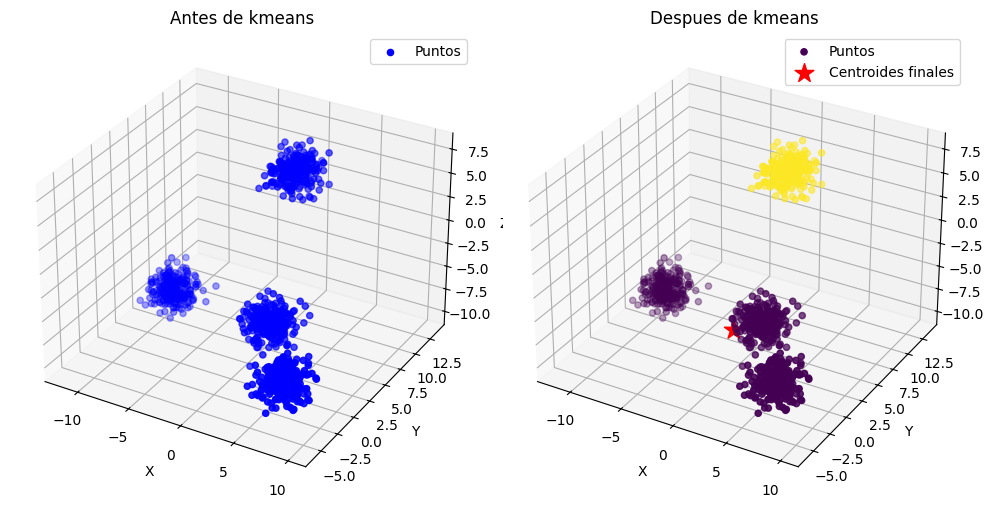

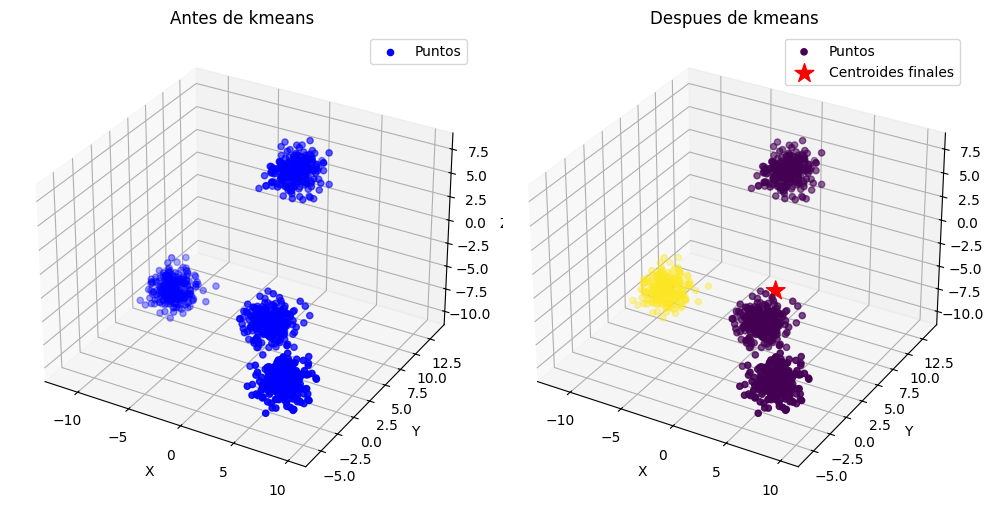

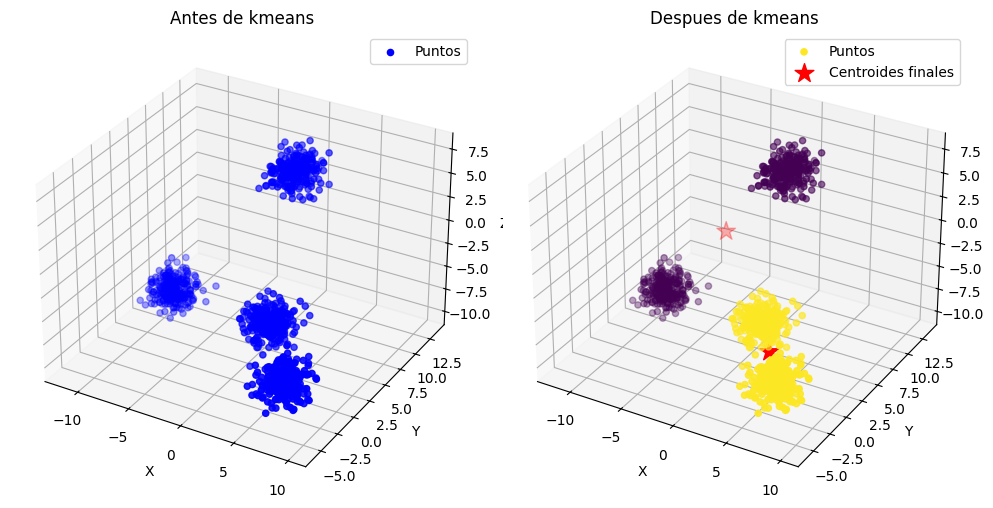

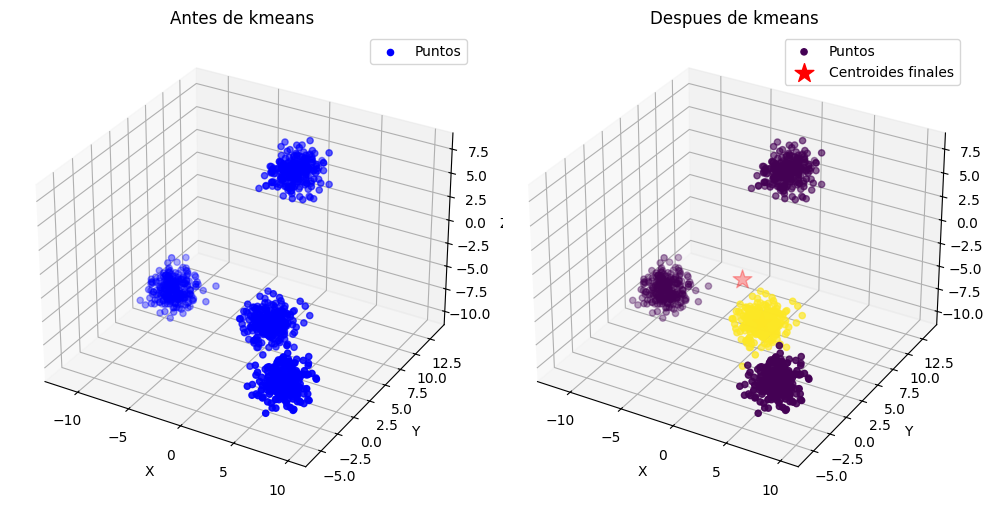

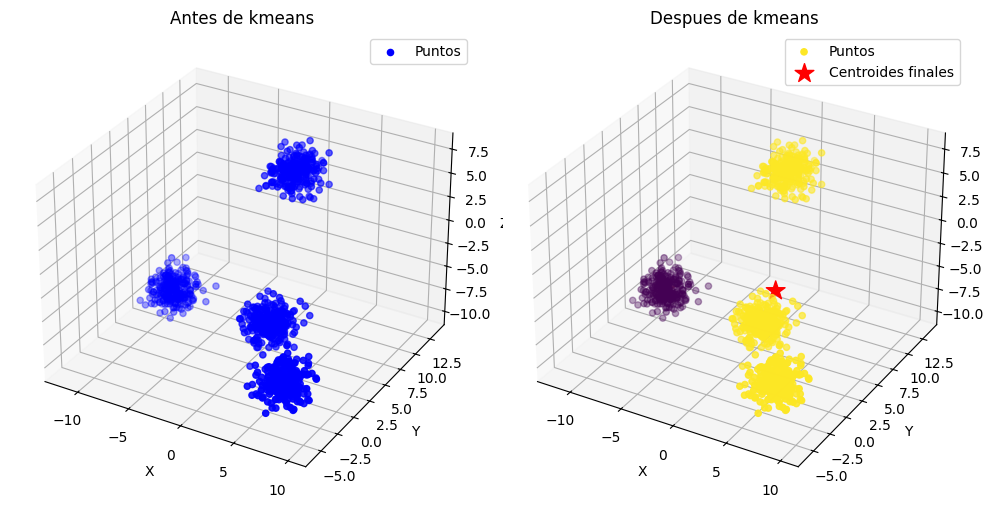

In [567]:
for i in range(5):
  kmeans = KMeans(k=2, max_iter=1000)
  labels = kmeans.run(points)
  dibujar3D(points, kmeans.centroids, labels)

# **Conclusion (experimento 17)**

podemos vizualizar en las graficas despues del kmeans que hay diferentes agrupaciones con diferentes colores algunas y que los centroides tienen ubicaciones variadas a partir de la tercera grafica

In [568]:
kmeans = KMeans(k=3, max_iter=1000)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[2 0 1 0 0 0 1 2 1 1 2 0 0 1 1 0 0 0 0 0 0 1 2 0 2 0 0 1 1 2 0 0 1 0 0 0 0
 0 0 0 0 2 0 2 0 1 0 0 2 2 2 2 2 0 0 1 0 0 0 0 2 0 2 1 0 0 1 1 2 0 0 1 1 1
 2 2 1 1 1 0 2 1 0 0 0 2 0 0 2 0 0 1 2 0 0 1 0 1 0 0 0 1 1 1 0 2 1 0 0 0 2
 0 2 1 1 1 0 0 0 2 1 0 0 2 2 0 0 2 1 0 2 0 1 0 1 0 0 2 0 2 0 0 0 1 0 0 0 0
 0 2 0 0 2 2 1 0 1 0 0 0 2 1 1 2 1 2 1 0 1 0 0 2 1 0 1 0 2 1 0 0 2 2 0 2 0
 1 2 0 0 0 1 2 1 0 2 0 0 2 0 2 2 2 0 0 0 1 0 0 1 0 0 1 1 1 1 1 0 0 1 1 1 1
 2 1 2 1 2 2 0 0 0 0 0 1 2 0 0 0 0 0 1 0 1 2 1 2 0 0 1 0 1 0 0 1 0 0 1 0 1
 1 2 0 2 2 0 0 0 0 1 0 1 0 1 1 2 2 0 1 0 0 0 0 2 0 2 2 1 2 0 1 0 0 0 1 2 0
 1 1 0 0 2 2 2 2 2 0 0 2 0 2 0 1 0 0 2 2 0 0 2 0 2 1 0 0 0 0 1 0 2 0 0 1 0
 1 0 0 0 0 0 0 0 1 0 0 0 2 0 0 1 0 0 2 2 0 0 2 1 2 1 1 0 2 0 1 0 1 2 0 0 0
 2 2 0 0 1 0 0 2 1 0 1 0 2 1 1 1 2 0 2 1 1 1 0 2 2 2 0 0 1 0 0 0 0 0 0 2 2
 0 2 1 1 2 2 1 1 2 0 0 1 2 0 2 0 0 1 0 1 1 0 0 0 0 0 1 0 0 1 1 0 0 0 0 1 2
 0 0 2 0 0 0 2 0 2 0 0 0 0 0 0 0 1 2 0 0 0 2 0 2 0 0 2 1 2 1 2 0 2 1 0 1 1
 0 1 0 0 2 0 1 1 0 2 1 1 

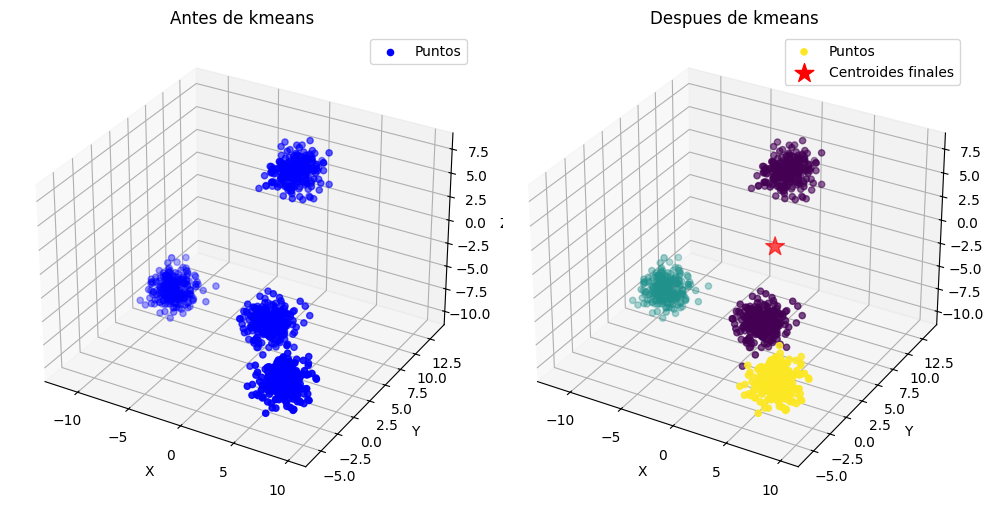

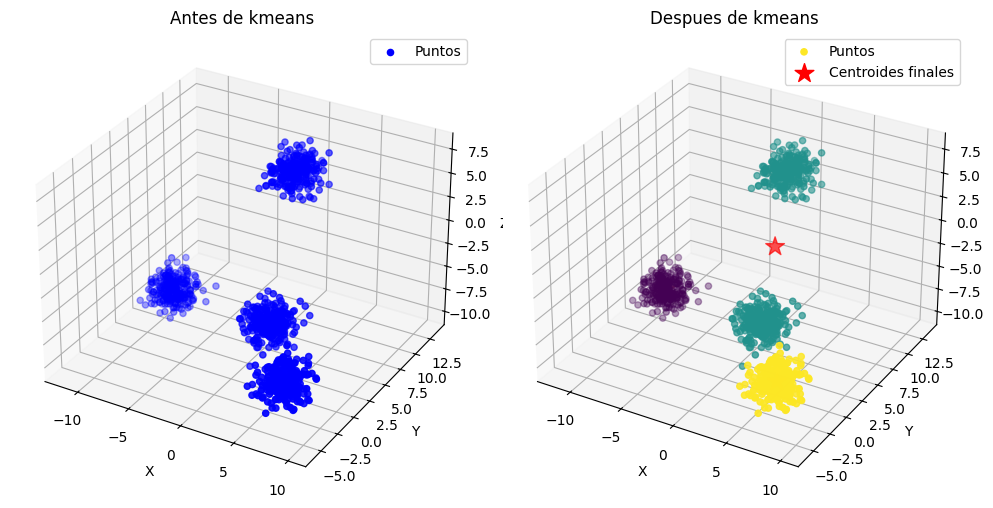

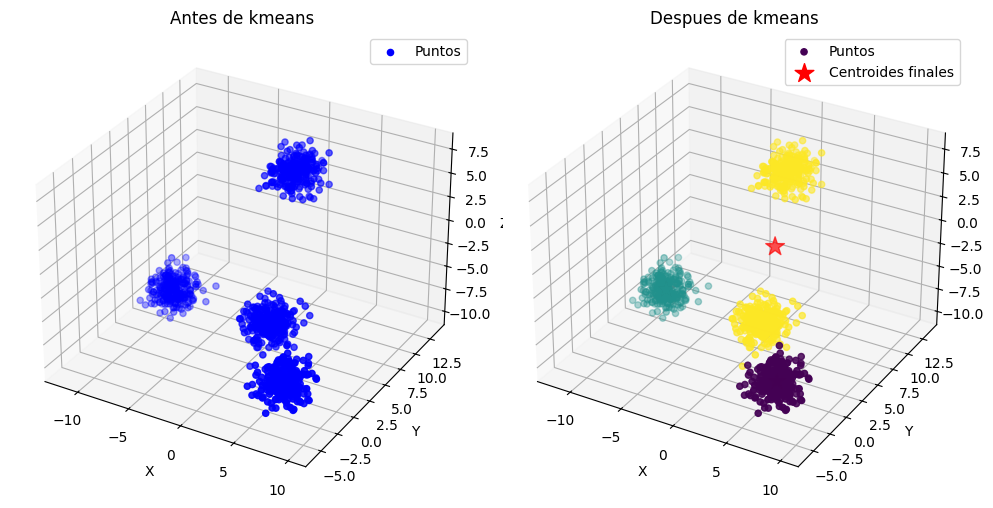

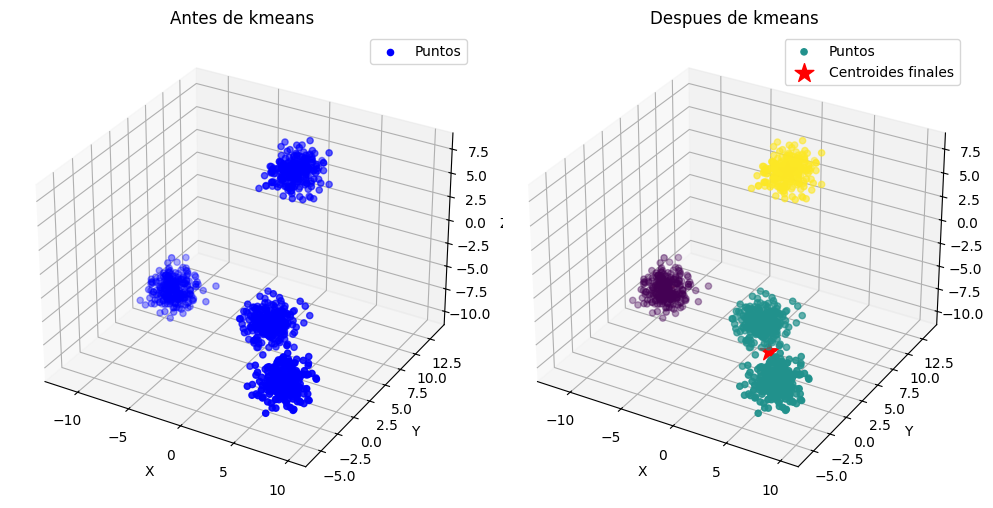

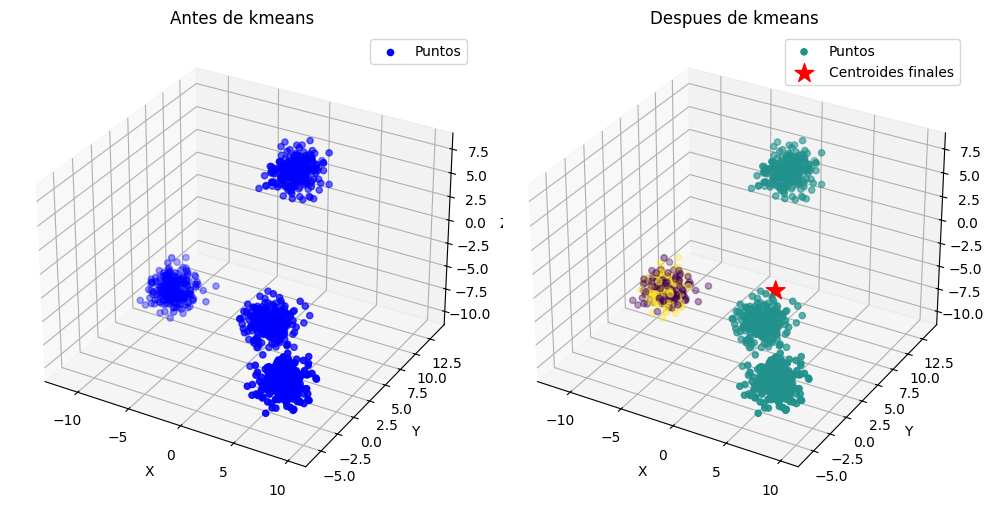

In [569]:
for i in range(5):
  kmeans = KMeans(k=3, max_iter=1000)
  labels = kmeans.run(points)
  dibujar3D(points, kmeans.centroids, labels)

# **Conclusion (experimento 18)**

podemos visualizar dentro de nuestras graficas del lado derecho despues del kmeans que en las dos primeras graficas los centroides tienen una ubicacion diferente mientras que en las tres ultimas los centroides continuan con una misma ubicacion

In [570]:
kmeans = KMeans(k=5, max_iter=1000)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[0 4 2 4 4 4 2 0 3 2 0 4 4 2 2 1 4 1 1 4 1 2 0 4 0 4 1 2 3 0 1 4 2 1 1 1 1
 1 1 4 1 0 1 0 1 2 4 1 0 0 0 0 0 1 1 2 1 1 4 1 0 1 0 2 1 1 2 2 0 4 4 2 2 2
 0 0 2 2 2 1 0 2 1 1 1 0 1 1 0 4 4 2 0 4 1 2 1 2 4 4 1 3 2 2 4 0 2 4 4 4 0
 4 0 2 2 2 4 1 4 0 2 4 1 0 0 4 4 0 2 1 0 1 2 4 2 4 1 0 4 0 4 4 4 2 1 1 4 1
 4 0 1 4 0 0 2 4 2 4 4 1 0 3 2 0 3 0 2 4 2 4 1 0 3 4 3 4 0 2 1 4 0 0 1 0 4
 2 0 4 4 1 2 0 3 4 0 4 4 0 1 0 0 0 1 1 4 2 4 1 2 4 4 2 2 2 2 2 4 1 2 3 2 2
 0 2 0 3 0 0 1 1 1 1 1 2 0 1 1 4 1 1 2 4 2 0 2 0 1 1 2 4 2 1 4 2 4 4 2 1 2
 2 0 4 0 0 4 4 4 4 3 1 2 4 2 2 0 0 4 2 4 4 4 1 0 4 0 0 2 0 4 2 4 1 1 2 0 4
 2 2 1 1 0 0 0 0 0 1 1 0 1 0 1 2 1 4 0 0 4 1 0 1 0 2 1 1 1 4 2 1 0 1 4 2 4
 2 1 1 4 1 4 4 1 2 1 4 1 0 4 1 2 1 4 0 0 1 1 0 2 0 2 2 4 0 1 2 4 3 0 1 1 1
 0 0 4 1 2 4 1 0 2 4 3 1 0 2 2 2 0 4 0 2 2 2 1 0 0 0 1 1 2 1 1 1 4 4 1 0 0
 4 0 3 2 0 0 2 2 0 1 1 2 0 1 0 4 4 2 1 2 2 1 4 4 1 1 2 1 4 2 2 1 1 4 4 2 0
 4 1 0 4 4 1 0 1 0 1 4 1 4 4 4 1 2 0 4 4 1 0 4 0 1 4 0 2 0 2 0 4 0 3 4 2 2
 4 2 4 4 0 1 2 2 4 0 2 3 

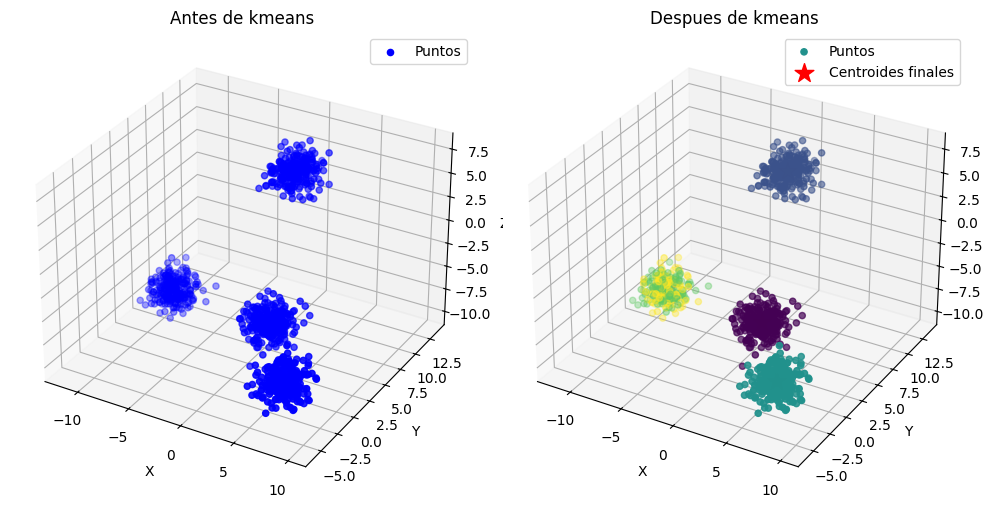

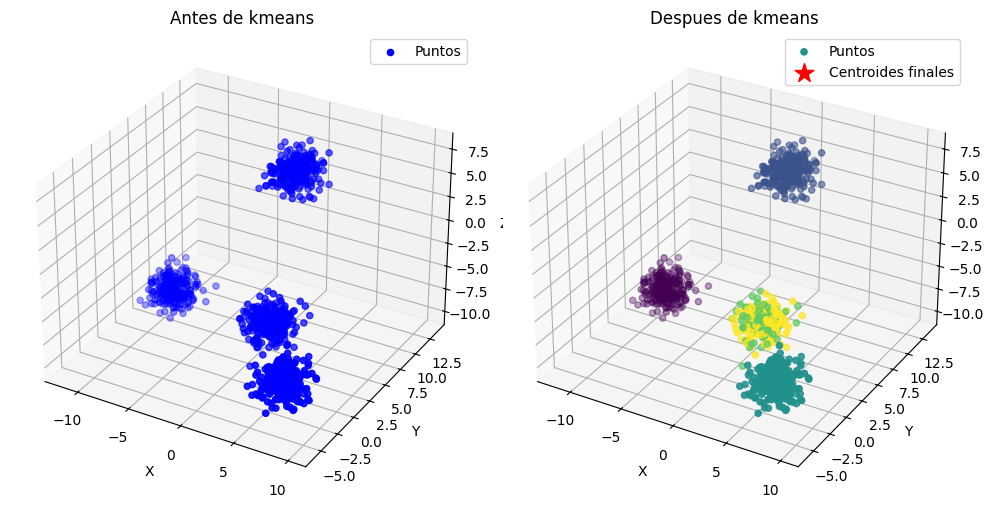

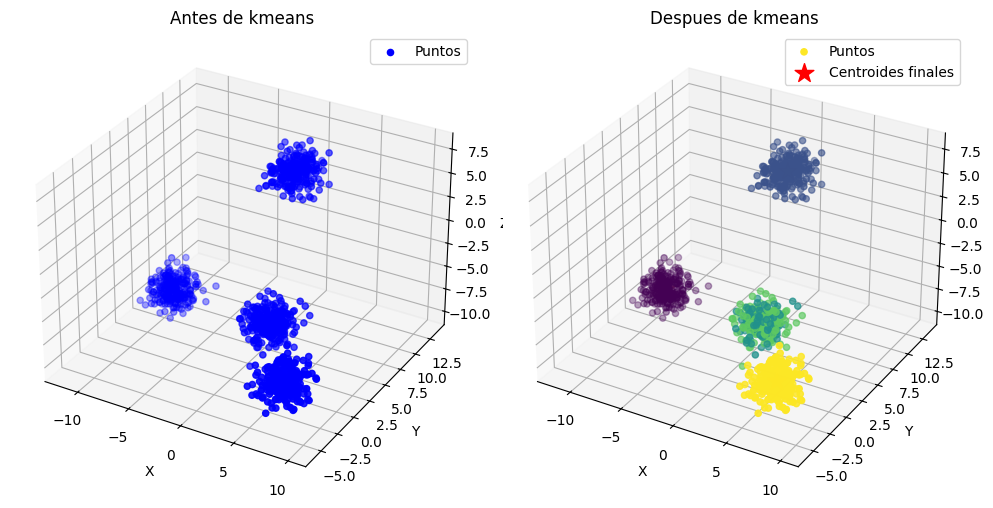

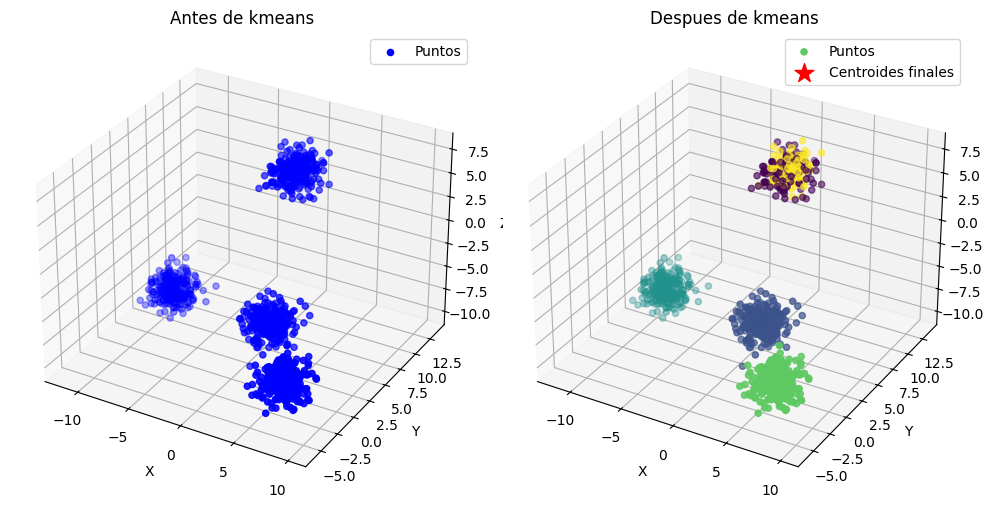

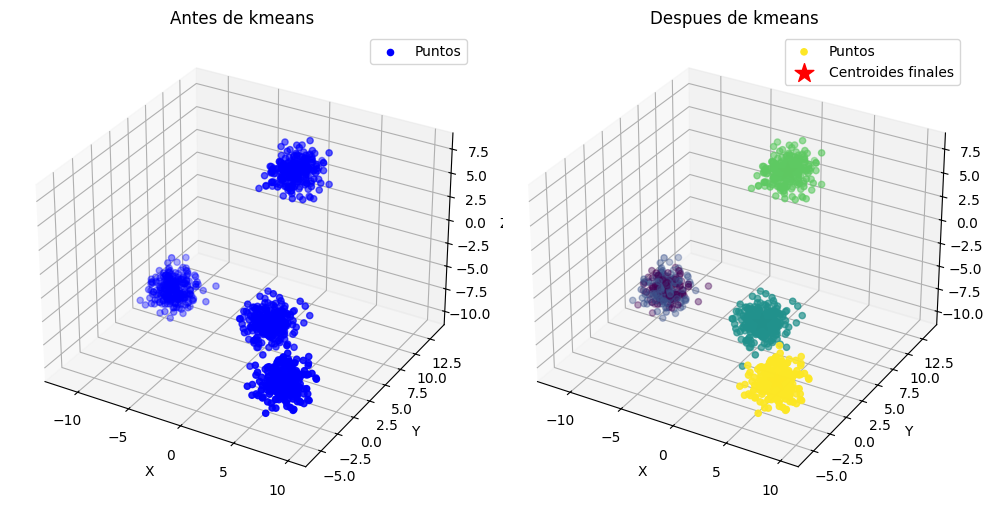

In [571]:
for i in range(5):
  kmeans = KMeans(k=5, max_iter=1000)
  labels = kmeans.run(points)
  dibujar3D(points, kmeans.centroids, labels)

# **Conclusion (experimento 19)**

En el lado derecho tenemos las graficas que nos señalan los cambios que tuvo en comparacion de la que esta a la derecha donde solo se muestran los puntos sin agruparse y con un solo tono de color que en este caso es azul. del lado derecho observamos una mezcla de cluster o agrupaciones con las diferentes ubicaciones que tuviueron los centroides.

In [572]:
kmeans = KMeans(k=10, max_iter=1000)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[1 5 3 5 5 8 3 1 3 3 1 5 5 3 9 0 5 0 0 6 0 3 7 8 1 5 0 3 3 1 0 5 3 0 0 4 0
 4 0 5 4 1 0 2 0 9 6 0 1 1 2 1 1 0 0 3 0 0 5 0 1 4 2 3 0 4 3 3 1 5 5 3 3 3
 1 1 3 9 3 0 2 3 4 4 4 2 4 0 1 6 8 3 1 5 0 3 0 3 5 6 0 3 3 3 5 2 3 8 5 5 1
 5 1 3 9 9 5 0 5 1 3 5 0 2 2 6 5 1 3 0 1 0 9 5 9 5 4 1 5 7 6 5 6 3 4 4 5 0
 5 1 4 8 7 2 9 5 3 6 5 0 1 3 3 2 3 1 9 5 3 5 0 1 3 5 3 5 1 3 0 5 1 1 4 1 5
 9 1 8 8 4 3 2 3 5 1 6 5 2 0 2 2 1 0 0 8 3 5 4 3 8 6 9 9 3 3 3 6 0 3 3 3 9
 1 9 1 3 1 1 4 0 0 0 4 9 1 0 4 8 0 0 3 5 3 1 3 2 0 4 3 8 3 4 5 9 8 5 3 0 3
 3 2 5 2 1 8 5 8 5 3 4 3 5 9 9 2 2 5 3 5 5 8 0 1 5 1 1 3 2 5 3 5 4 4 3 2 5
 9 3 0 4 1 2 1 1 1 0 0 2 4 1 0 9 0 5 1 1 5 0 2 0 7 9 4 0 4 5 9 0 1 4 5 3 6
 3 4 0 5 4 5 5 0 3 4 5 0 2 6 0 9 0 5 1 2 4 4 1 9 2 3 3 5 2 4 3 5 3 7 0 4 0
 2 1 5 4 3 5 0 2 9 5 3 0 2 3 3 3 1 5 1 9 3 3 4 1 2 1 0 0 3 4 0 0 5 5 0 2 2
 5 1 3 3 1 2 3 3 2 0 4 3 7 0 2 5 5 3 4 3 3 0 5 5 4 0 3 0 5 3 9 4 0 8 5 3 7
 5 0 1 6 5 0 1 0 7 4 5 4 5 6 5 4 3 2 5 5 0 1 5 1 4 6 1 3 1 3 1 5 1 3 6 3 3
 8 3 5 5 1 0 3 3 5 1 3 3 

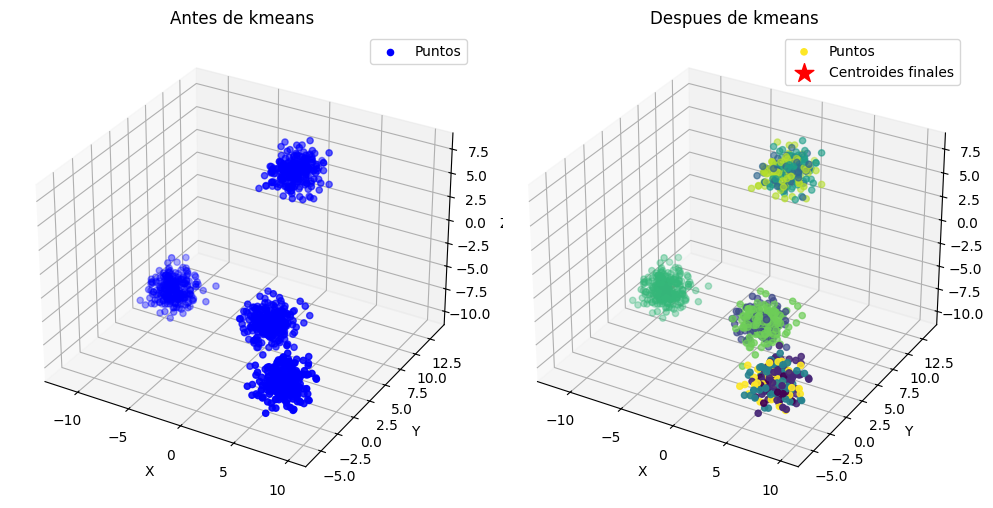

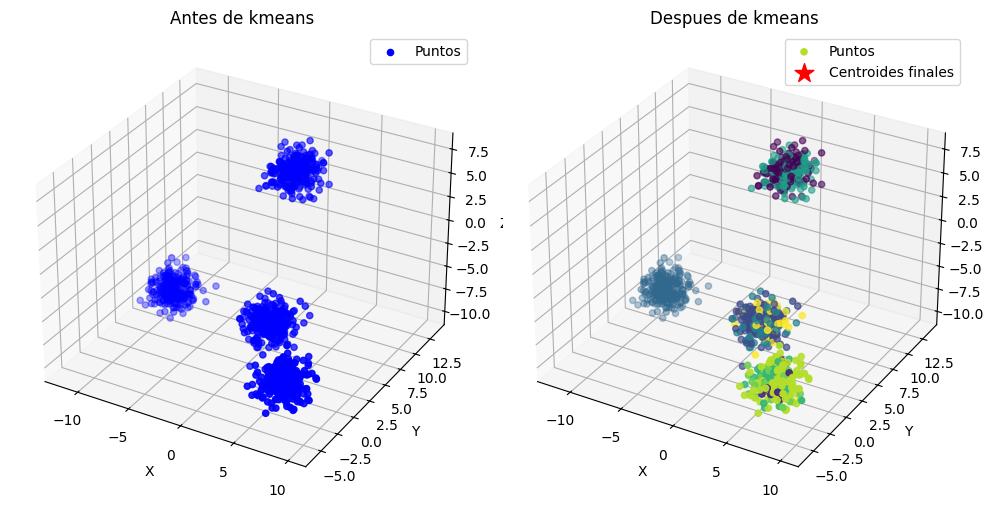

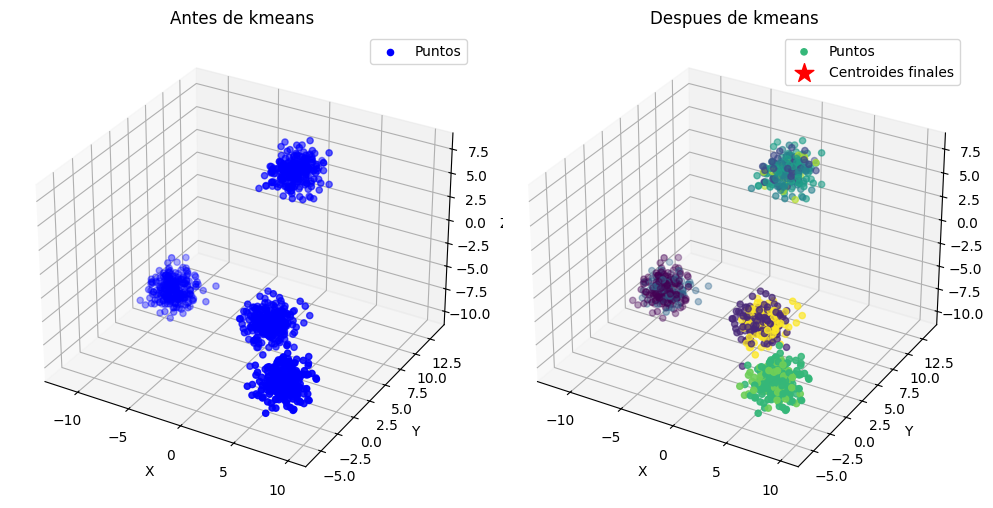

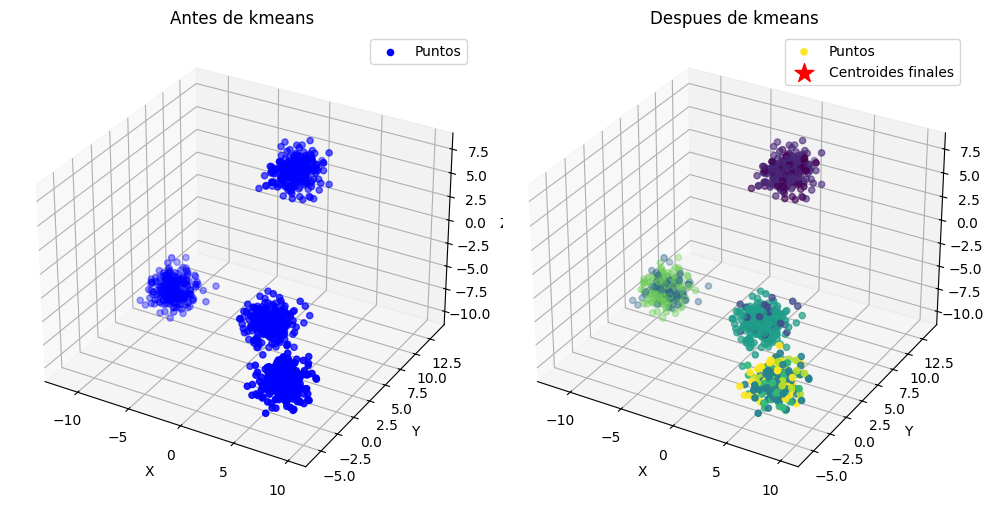

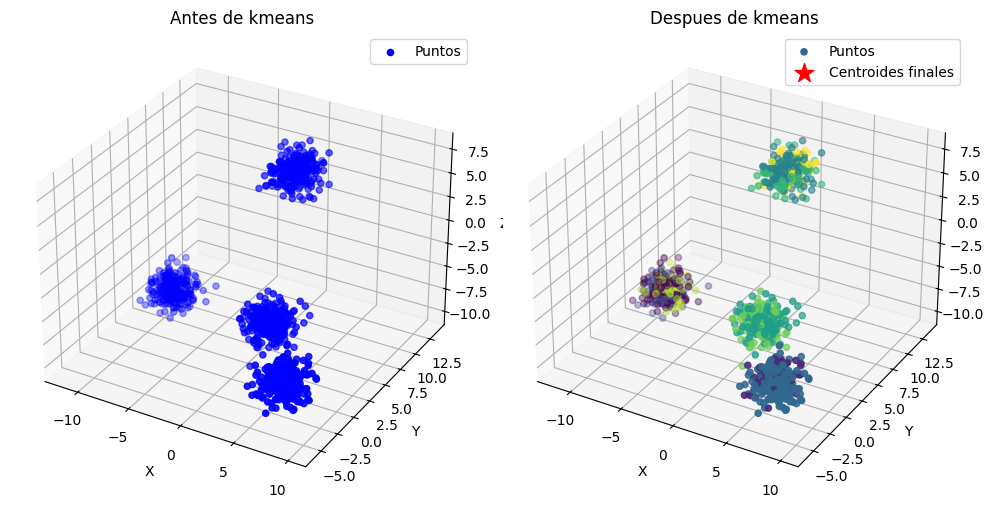

In [573]:
for i in range(5):
  kmeans = KMeans(k=10, max_iter=1000)
  labels = kmeans.run(points)
  dibujar3D(points, kmeans.centroids, labels)

# **Conclusion (experimento 20)**

en el lado derecho en las graficas despues de kmeans podemos observar que hay mas agrupaciones y que hay una mezcla entre dichas agrupaciones y tambien el cambio que tuvo el centroide desde la primera iteracion.

# **PUNTO 6**

In [574]:
from sklearn.datasets import make_blobs
points, y = make_blobs(n_samples = 1000,n_features = 2,centers = 4,random_state = 23)

In [575]:
kmeans = KMeans(k=5 , max_iter=1000)
labels = kmeans.run(points, tipo_distance="euclidean")
print(labels)
print(kmeans.centroids)

[0 3 4 1 3 3 3 2 1 4 4 4 3 0 0 1 2 1 0 0 4 1 1 2 4 4 2 0 4 4 4 3 0 0 3 1 1
 1 3 1 4 0 0 1 3 3 4 0 3 2 1 1 3 1 4 1 4 4 3 0 3 4 1 3 1 3 0 0 0 1 3 4 4 0
 3 3 4 0 3 3 4 1 3 3 4 4 0 2 3 3 4 0 3 4 3 4 0 0 3 0 3 2 3 1 0 3 2 0 3 3 4
 0 3 0 3 3 1 3 1 0 4 2 0 2 0 1 4 3 3 0 2 3 4 2 3 0 0 1 3 1 0 4 4 2 1 0 0 3
 0 0 4 0 4 4 3 0 1 0 1 4 3 1 4 2 3 3 0 4 3 0 3 0 3 0 4 2 4 4 3 2 0 0 0 2 3
 1 4 3 3 0 0 1 0 2 0 3 3 4 3 0 0 4 2 1 4 4 3 4 3 4 4 3 4 2 3 4 3 2 4 0 1 2
 4 3 4 3 4 1 1 3 4 2 1 3 3 0 3 0 3 1 4 0 4 2 1 3 1 3 3 0 4 1 0 4 2 3 4 2 4
 3 0 3 2 4 0 0 1 4 4 3 1 3 4 1 0 3 4 0 0 3 3 0 0 4 0 3 0 1 4 4 0 4 4 0 3 3
 0 3 4 0 2 1 3 2 0 1 4 3 0 4 4 0 4 4 3 3 0 4 2 1 4 1 4 0 0 4 1 3 0 3 0 0 4
 3 4 0 4 4 3 4 4 3 4 3 3 2 4 4 0 1 1 0 4 1 2 0 0 4 0 2 3 0 4 3 0 3 3 0 0 4
 0 3 1 3 3 1 0 3 1 0 0 4 3 3 3 3 3 4 4 1 4 0 3 3 3 3 4 4 3 0 0 0 1 4 4 0 1
 0 4 0 3 3 4 2 2 2 4 0 1 1 3 3 0 3 3 0 1 0 2 1 1 1 4 4 1 2 0 0 2 0 3 3 0 0
 4 0 3 2 4 4 4 3 3 3 4 0 0 0 3 0 2 2 4 3 1 2 0 2 3 3 1 3 1 1 4 3 0 4 4 0 4
 4 2 3 2 4 0 0 2 1 1 0 1 

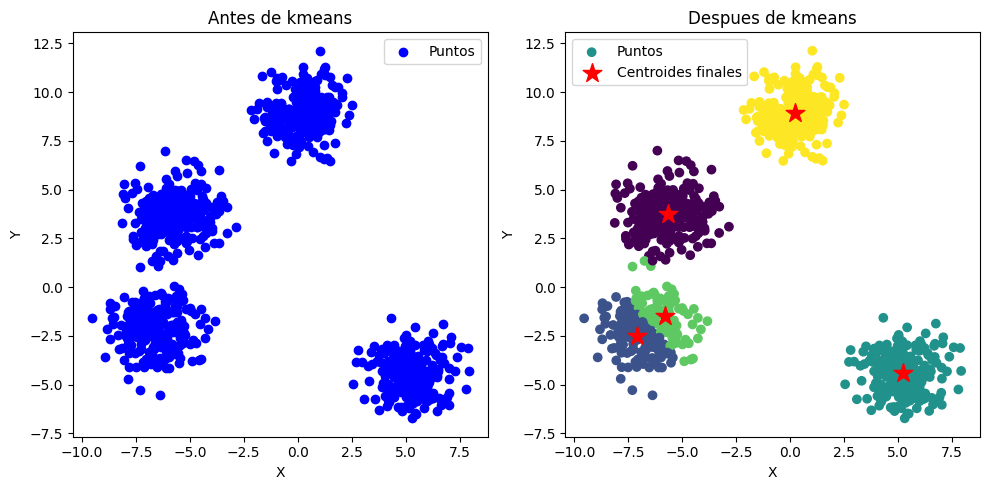

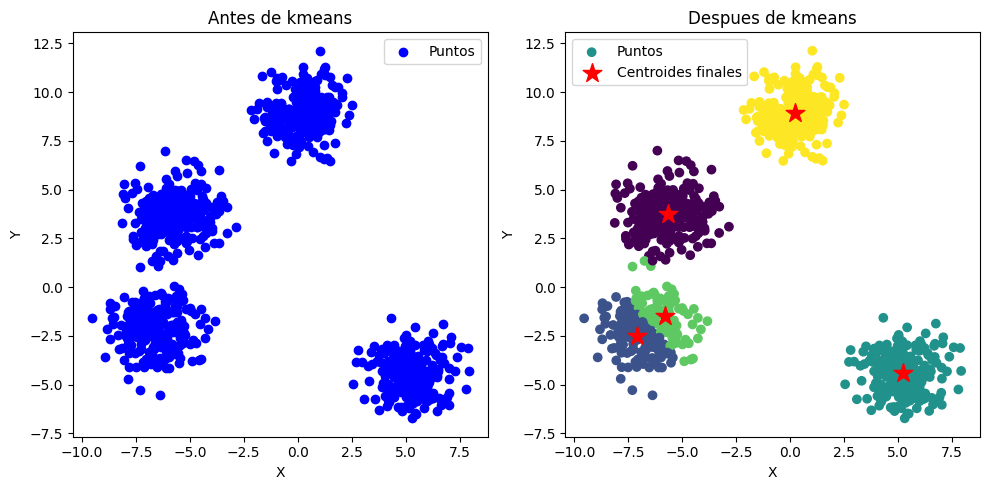

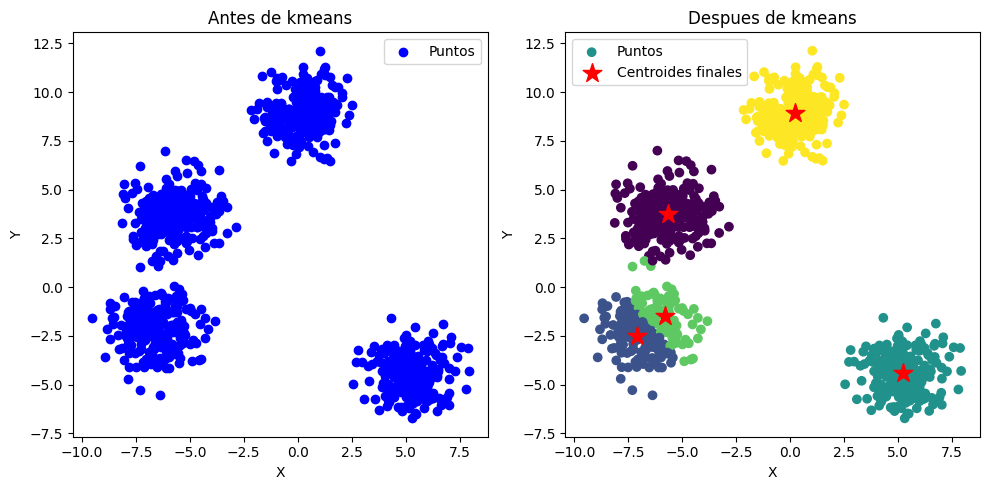

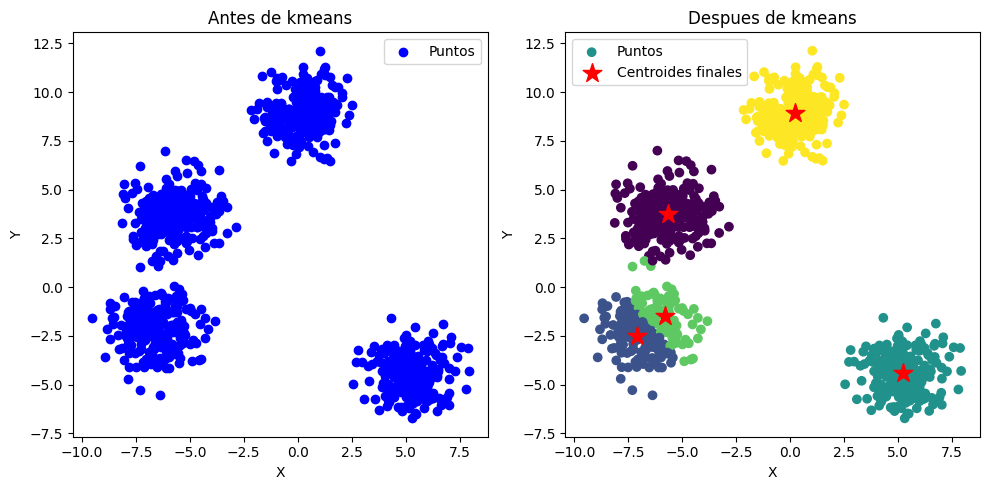

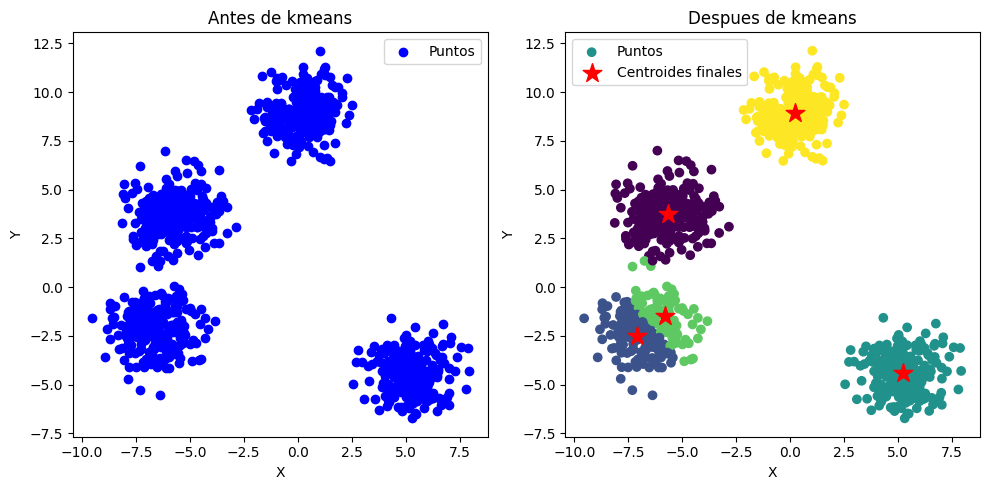

In [587]:
for i in range(5):
  dibujar2D(points, kmeans.centroids, labels)

# **Conclusion (experimento 21)**

aqui podemnos observar que en base a la distancia Euclidiana, hay cinco diferentes grupos con sus respectivos centroides, de esta manera podemos concluir que al estar bien definidos los cluster hay una distancia euclidiana efectiva y esta estructurado de manera correcta

In [582]:
kmeans = KMeans(k=5 , max_iter=1000)
labels = kmeans.run(points, tipo_distance="manhattan")
print(labels)
print(kmeans.centroids)

[4 0 3 1 0 0 0 1 1 3 3 3 0 2 2 1 1 1 2 2 3 1 1 1 3 3 1 2 3 3 3 0 2 4 0 1 1
 1 0 1 3 2 2 1 0 0 3 4 0 1 1 1 0 1 3 1 3 3 0 4 0 3 1 0 1 0 2 2 2 1 0 3 3 2
 0 0 3 4 0 0 3 1 0 0 3 3 4 1 0 0 3 2 0 3 0 3 2 2 0 4 0 1 0 1 4 0 1 4 0 0 3
 2 0 2 0 0 1 0 1 2 3 1 4 1 4 1 3 0 0 2 1 0 3 1 0 4 4 1 0 1 4 3 3 1 1 4 2 0
 4 2 3 2 3 3 0 4 1 2 1 3 0 1 3 1 0 0 4 3 0 2 0 4 0 4 3 1 3 3 0 1 4 2 4 1 0
 1 3 0 0 4 4 1 4 1 2 0 0 3 0 4 4 3 1 1 3 3 0 3 0 3 3 0 3 1 0 3 0 1 3 2 1 1
 3 0 3 0 3 1 1 0 3 1 1 0 0 4 0 2 0 1 3 2 3 1 1 0 1 0 0 4 3 1 4 3 1 0 3 1 3
 0 2 0 1 3 4 2 1 3 3 0 1 0 3 1 2 0 3 4 2 0 0 2 2 3 2 0 2 1 3 3 2 3 3 2 0 0
 2 0 3 4 1 1 0 1 4 1 3 0 4 3 3 2 3 3 0 0 2 3 1 1 3 1 3 4 2 3 1 0 4 0 2 2 3
 0 3 4 3 3 0 3 3 0 3 0 0 1 3 3 2 1 1 4 3 1 1 4 2 3 2 1 0 4 3 0 4 0 0 2 4 3
 4 0 1 0 0 1 4 0 1 2 2 3 0 0 0 0 0 3 3 1 3 2 0 0 0 0 3 3 0 2 4 2 1 3 3 4 1
 4 3 2 0 0 3 1 1 1 3 4 1 1 0 0 4 0 0 4 1 2 1 1 1 1 3 3 1 1 4 4 1 2 0 0 2 4
 3 4 0 1 3 3 3 0 0 0 3 2 4 4 0 2 1 1 3 0 1 1 4 1 0 0 1 0 1 1 3 0 4 3 3 4 3
 3 1 0 1 3 2 4 1 1 1 2 1 

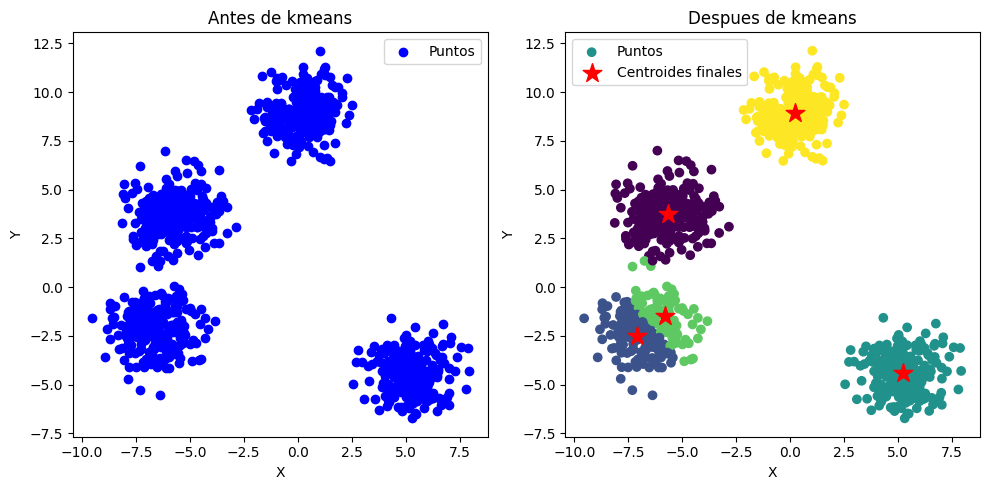

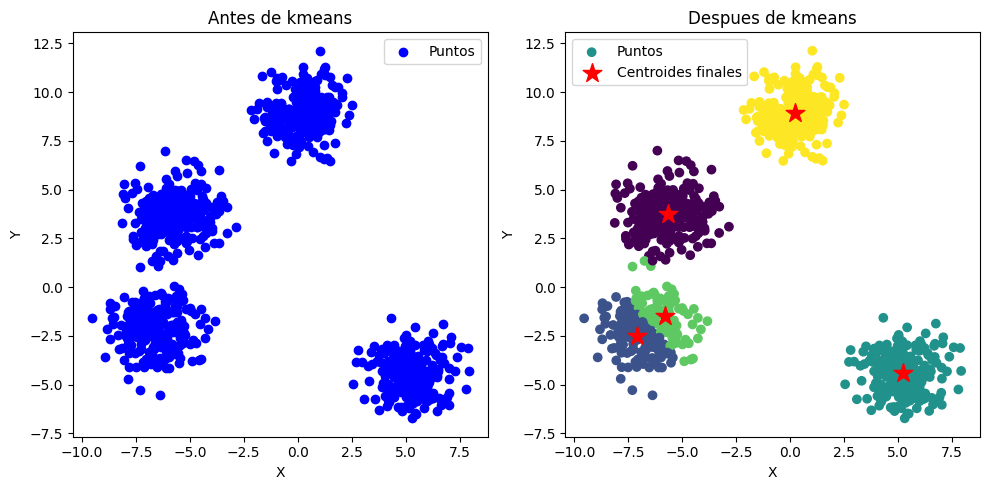

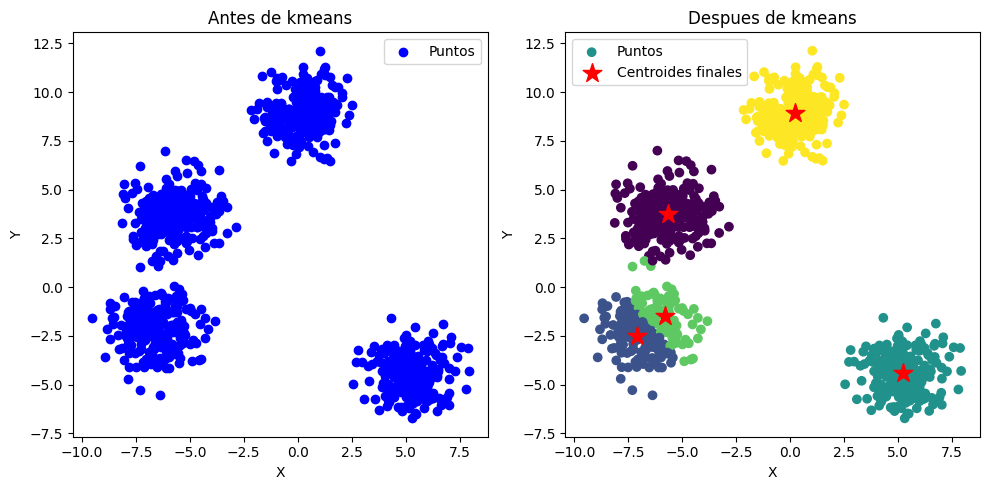

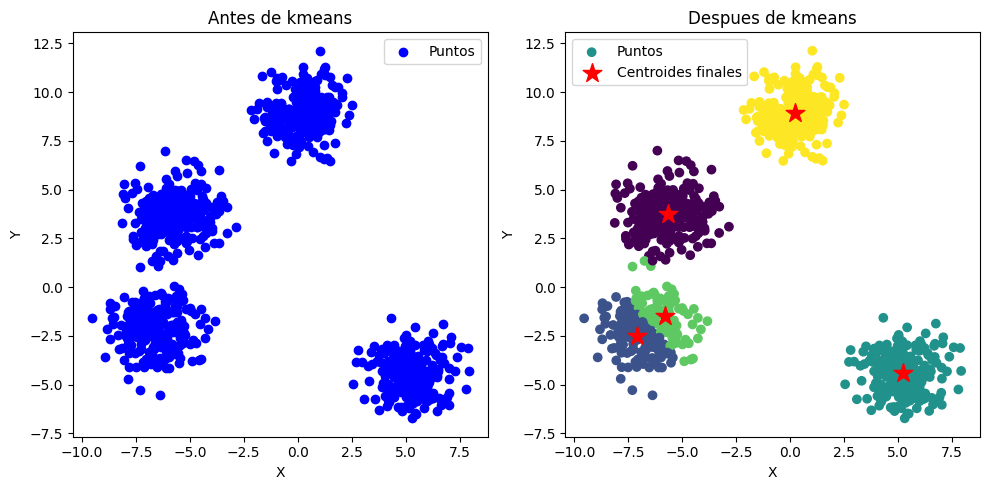

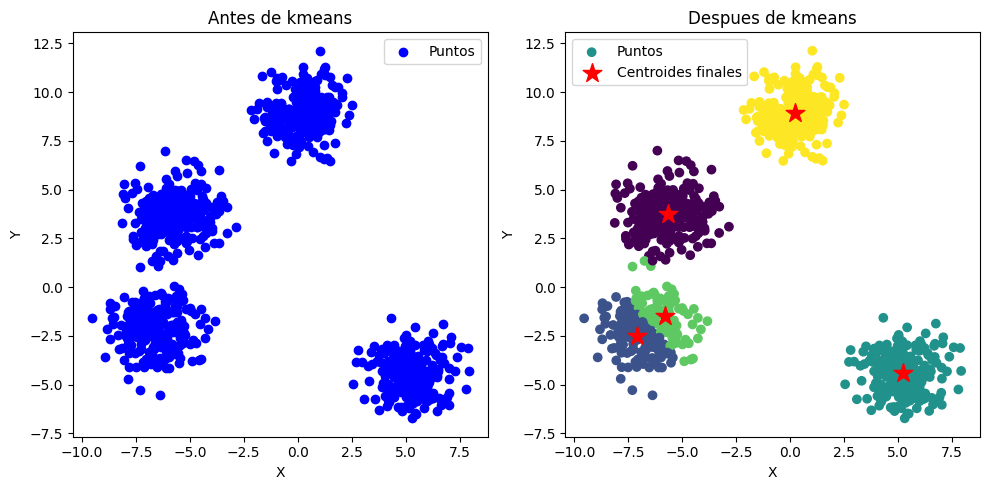

In [588]:
for i in range(5):
  dibujar2D(points, kmeans.centroids, labels)

# **Conclusion (experimento 22)**
se logro  agrupar correctamente los datos, ya que los puntos de cada cluster están bien definidos y separados, con centroides ubicados en el centro geométrico de cada grupo. La asignación de colores en la imagen derecha indica que la clasificación es coherente con la distribución original, y no se observan asignaciones erróneas ni solapamientos significativos entre clusters. Además, la separación visual entre grupos sugiere que la distancia Euclidiana fue una métrica adecuada para este conjunto de datos, logrando una segmentación eficiente y representativa.


In [584]:
kmeans = KMeans(k=5 , max_iter=1000)
labels = kmeans.run(points, tipo_distance="mahalanobis")
print(labels)
print(kmeans.centroids)

[2 0 4 1 0 0 0 3 1 4 4 4 0 2 2 1 3 3 2 2 4 3 1 1 4 4 1 2 4 4 4 0 2 2 0 1 1
 3 0 1 4 2 2 3 0 0 4 2 0 1 1 3 0 1 4 1 4 4 0 2 0 4 1 0 1 0 2 2 2 3 0 4 4 2
 0 0 4 2 0 0 4 1 0 0 4 4 2 1 0 0 4 2 0 4 0 4 2 2 0 2 0 1 0 1 2 0 3 2 0 0 4
 2 0 2 0 0 1 0 3 2 4 1 2 1 2 1 4 0 0 2 1 0 4 3 0 2 2 1 0 1 2 4 4 1 3 2 2 0
 2 2 4 2 4 4 0 2 1 2 1 4 0 1 4 1 0 0 2 4 0 2 0 2 0 2 4 3 4 4 0 3 2 2 2 3 0
 1 4 0 0 2 2 1 2 1 2 0 0 4 0 2 2 4 1 3 4 4 0 4 0 4 4 0 4 3 0 4 0 1 4 2 1 3
 4 0 4 0 4 3 1 0 4 1 1 0 0 2 0 2 0 1 4 2 4 1 3 0 3 0 0 2 4 1 2 4 1 0 4 3 4
 0 2 0 3 4 2 2 3 4 4 0 1 0 4 1 2 0 4 2 2 0 0 2 2 4 2 0 2 3 4 4 2 4 4 2 0 0
 2 0 4 2 1 1 0 1 2 1 4 0 2 4 4 2 4 4 0 0 2 4 3 1 4 1 4 2 2 4 3 0 2 0 2 2 4
 0 4 2 4 4 0 4 4 0 4 0 0 1 4 4 2 3 1 2 4 3 1 2 2 4 2 1 0 2 4 0 2 0 0 2 2 4
 2 0 1 0 0 3 2 0 1 2 2 4 0 0 0 0 0 4 4 1 4 2 0 0 0 0 4 4 0 2 2 2 1 4 4 2 1
 2 4 2 0 0 4 1 1 3 4 2 1 3 0 0 2 0 0 2 1 2 1 1 3 3 4 4 1 1 2 2 1 2 0 0 2 2
 4 2 0 3 4 4 4 0 0 0 4 2 2 2 0 2 1 3 4 0 1 1 2 1 0 0 1 0 1 3 4 0 2 4 4 2 4
 4 1 0 3 4 2 2 3 1 1 2 3 

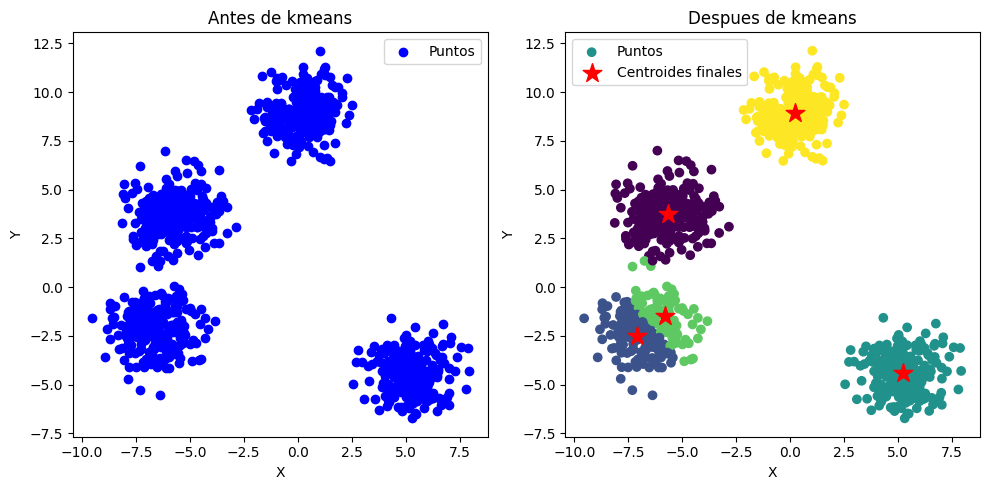

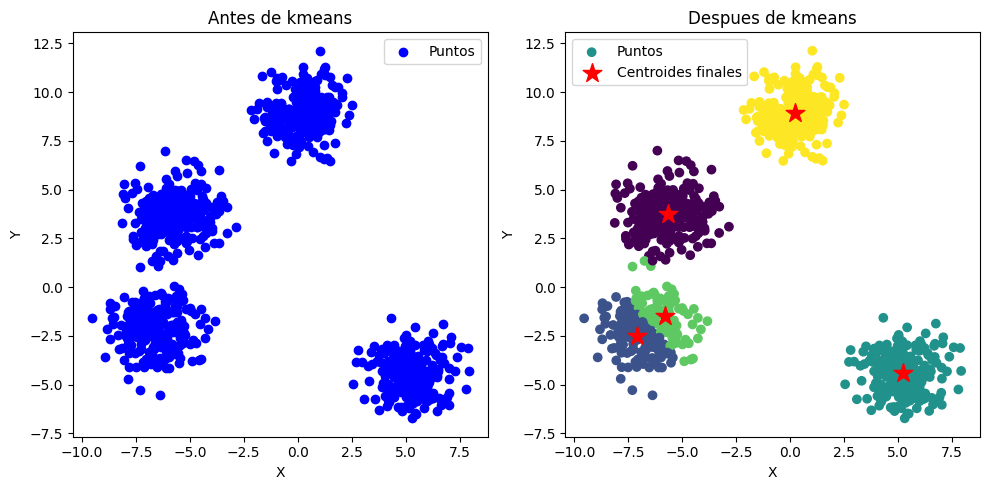

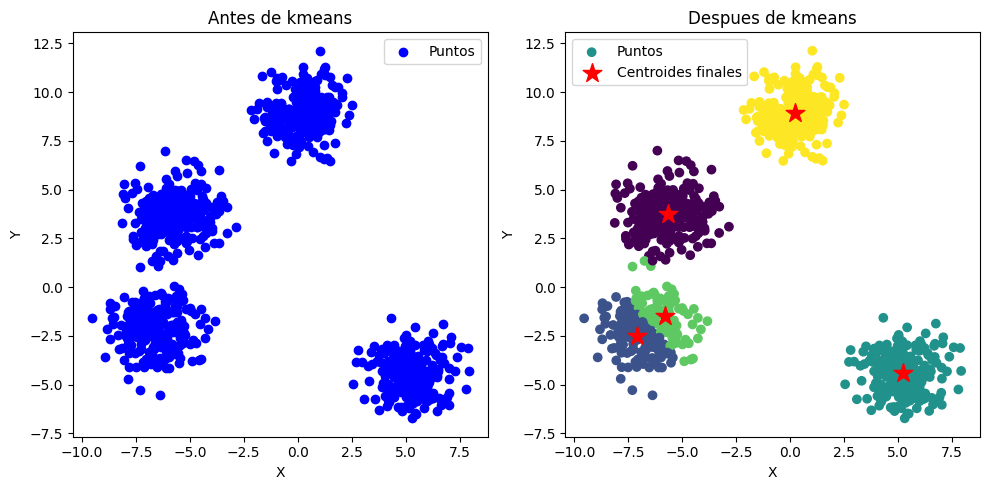

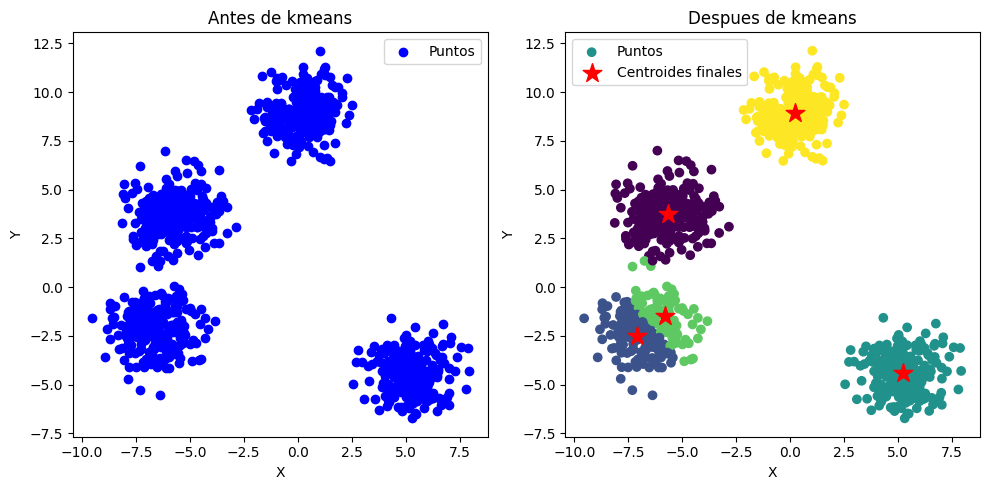

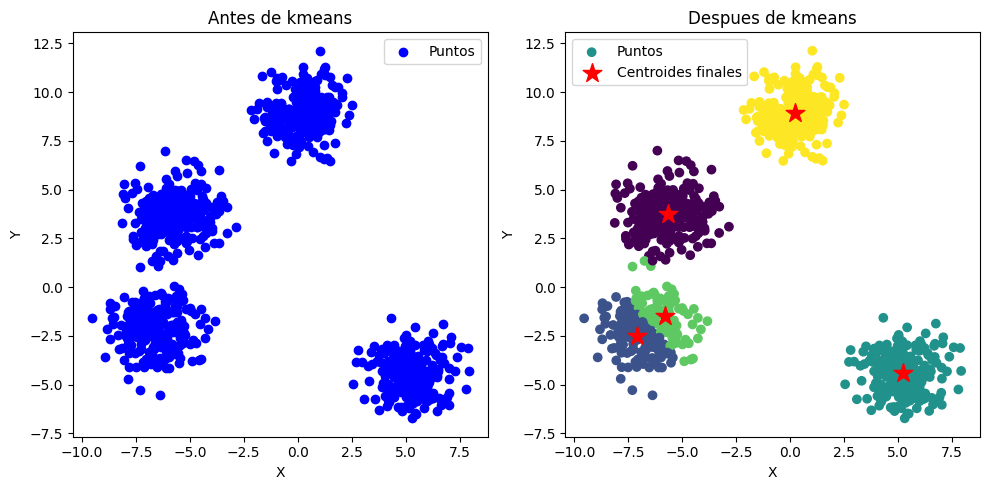

In [589]:
for i in range(5):
  dibujar2D(points, kmeans.centroids, labels)

# **Conclusion (experimento 23)**

A diferencia de las distancias Euclidiana y Manhattan, la distancia de Mahalanobis tiene en cuenta la correlación entre las variables y la dispersión de los datos, lo que permite formar clusters más adaptativos en función de la distribución de los puntos. En la imagen, se pueden notar diferencias en la asignación de algunos puntos y en la ubicación de los centroides, ya que Mahalanobis ajusta los clusters dependiendo de la forma y orientación de los datos.

# **PUNTO 7**

Experimento 1: Podemos observar que a partir de la tercera iteracion hay una convergencia, es decir, que los centroides vuelven a estar en la misma ubicacion que los centroides anteriores

Experimento 2:Podemos observar que a partir de la quinta iteracion hay una convergencia

Experimento 3:Podemos observar que a partir de la segunda iteracion hay una convergencia

Experimento 4:Podemos observar que a partir de la segunda iteracion hay una convergencia

Experimento 5:Podemos observar que a partir de la segunda iteracion hay una convergencia

Experimento 6:Podemos observar que a partir de la segunda iteracion hay una convergencia

Experimento 7:Podemos observar que a partir de la tercera iteracion hay una convergencia

Experimento 8:Podemos observar que a partir de la segunda iteracion hay una convergencia

Experimento 9:Podemos observar que a partir de la tercera iteracion hay una convergencia

Experimento 10:Podemos observar que a partir de la quinta iteracion hay una convergencia

Experimento 11:Podemos observar que a partir de la segunda iteracion hay una convergencia

Experimento 12:Podemos observar que a partir de la segunda iteracion hay una convergencia

Experimento 13:Podemos observar que a partir de la cuarta iteracion hay una convergencia

Experimento 14:Podemos observar que a partir de la tercera iteracion hay una convergencia

Experimento 15:Podemos observar que a partir de la segunda iteracion hay una convergencia

Experimento 16:Podemos observar que a partir de la tercera iteracion hay una convergencia

Experimento 17:Podemos observar que a partir de la cuarta iteracion hay una convergencia

Experimento 18:Podemos observar que a partir de la segunda iteracion hay una convergencia

Experimento 19:Podemos observar que a partir de la segunda iteracion hay una convergencia

Experimento 20:Podemos observar que a partir de la segunda iteracion hay una convergencia

Experimento 21:Podemos observar que a partir de la segunda iteracion hay una convergencia

Experimento 22:Podemos observar que a partir de la segunda iteracion hay una convergencia

Experimento 23:Podemos observar que a partir de la segunda iteracion hay una convergencia
